In [1]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 66.7 MB/s eta 0:00:00:00:0100:01


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rasterio

def cloud_shadow_detection_separate_bands(
    green_band_file,  # Path to Green band (G)
    red_band_file,    # Path to Red band (R)
    nir_band_file,    # Path to NIR band
    output_cloud_mask_file, 
    output_cloud_shadow_mask_file,
    T1, t2, t3, t4,      # Threshold parameters
    T5, T6, T7, T8   # Filtering & spatial search parameters
):
    """
    Cloud/Shadow Detection for separately provided Green, Red, and NIR bands.
    
    Inputs:
    - green_band_file: File path for Green band (G)
    - red_band_file: File path for Red band (R)
    - nir_band_file: File path for NIR band
    - output_cloud_mask_file: Output path for cloud mask
    - output_cloud_shadow_mask_file: Output path for shadow mask
    - T1: Threshold for CI1 (e.g., 0.5)
    - t2: Adjusting coefficient for T2 (controls cloud sensitivity)
    - t3: Adjusting coefficient for T3 (controls shadow sensitivity)
    - T5, T6: Search window size (e.g., 11x11)
    - T7: Median filter size for cloud mask (e.g., 5)
    - T8: Median filter size for shadow mask (e.g., 5)
    """
    
    # Read each band separately
    with rasterio.open(green_band_file) as g:
        green = g.read(1)
        metadata = g.profile  # Save metadata for output
    
    with rasterio.open(red_band_file) as r:
        red = r.read(1)
    
    with rasterio.open(nir_band_file) as n:
        nir = n.read(1)
    print("Original band: ", green.shape)
    
    # Stack bands into a 3D array (H, W, 3)
    img = np.dstack((green, red, nir))  # Order: [G, R, NIR]
    
    # Cloud Detection (Modified CI1 & CI2 without Blue band)
    ci_1 = (3 * img[:, :, 2]) / (img[:, :, 1] + img[:, :, 0] + 1e-10)  # NIR / (R + G + 1)
    ci_2 = (img[:, :, 0] + img[:, :, 1] + img[:, :, 2]) / 3  # Avg of G, R, NIR
    
    # Adaptive threshold for cloud detection
    T2 = np.mean(ci_2) + (t2 * (np.max(ci_2) - np.mean(ci_2)))
    
    # Preliminary cloud mask
    prelim_cloud_mask = np.float32(np.logical_and(np.abs(ci_1 - 1) < T1, ci_2 > T2))
    print("prelim_cloud_mask: ", prelim_cloud_mask.shape)
    final_cloud_mask = cv2.medianBlur(prelim_cloud_mask, T7)
    print("final_cloud_mask: ", final_cloud_mask.shape)
    final_cloud_mask = np.expand_dims(final_cloud_mask, axis=2).astype(np.uint16)
    print("final_cloud_mask: ", final_cloud_mask.shape)
    
    # # Shadow Detection (Using NIR and (G) instead of Blue band)
    T3 = np.min(img[:, :, 2]) + (t3 * (np.mean(img[:, :, 2]) - np.min(img[:, :, 2])))  # NIR threshold
    T4 = np.min(img[:, :, 0]) + (t4 * (np.mean(img[:, :, 0]) - np.min(img[:, :, 0])))  # (G) threshold
    
    prelim_cloud_shadow_mask = np.float32(np.logical_and(img[:, :, 2] < T3, (img[:, :, 0]) < T4))

    # plt.figure(figsize=(10, 8))
    # plt.imshow(prelim_cloud_shadow_mask, cmap='Reds', alpha=0.5)  # Adjust vmax based on your data
    # plt.imshow(final_cloud_mask, cmap = 'Blues_r', alpha=0.5)
    # plt.title('prelim_cloud_shadow_mask')
    # plt.show()

    # Spatial matching to refine shadow mask
    spatial_search_kernel = np.ones((T5, T6), dtype=np.float32)
    non_pseudo_cloud_shadow_position_mask = cv2.filter2D(final_cloud_mask, -1, spatial_search_kernel) < 0
    
    refined_cloud_shadow_mask = prelim_cloud_shadow_mask * non_pseudo_cloud_shadow_position_mask

    # plt.figure(figsize=(10, 8))
    # img = plt.imshow(refined_cloud_shadow_mask, cmap='Reds')  # Adjust vmax based on your data
    # plt.title('refined_cloud_shadow_mask')
    # plt.show()
    
    final_cloud_shadow_mask = cv2.medianBlur(refined_cloud_shadow_mask, T8)
    final_cloud_shadow_mask = np.expand_dims(final_cloud_shadow_mask, axis=2).astype(np.uint8)
    print("final_cloud_shadow_mask: ", final_cloud_shadow_mask.shape)
    # Save outputs
    metadata['count'] = 1
    metadata['dtype'] = 'uint8'
    
    with rasterio.open(output_cloud_mask_file, 'w', **metadata) as dst:
        dst.write(final_cloud_mask.transpose(2, 0, 1))  # Reshape to (1, H, W)
        
    with rasterio.open(output_cloud_shadow_mask_file, 'w', **metadata) as dst2:
        dst2.write(final_cloud_shadow_mask.transpose(2, 0, 1))
        
    return final_cloud_mask, final_cloud_shadow_mask

In [27]:
# import cv2
# import numpy as np
# import rasterio

# def cloud_shadow_detection_separate_bands(
#     green_band_file,  # Path to Green band (G)
#     red_band_file,    # Path to Red band (R)
#     nir_band_file,    # Path to NIR band
#     output_cloud_mask_file, 
#     output_cloud_shadow_mask_file,
#     T1, t2, t3, t4,      # Threshold parameters
#     T5, T6, T7, T8   # Filtering & spatial search parameters
# ):
#     """
#     Cloud/Shadow Detection for separately provided Green, Red, and NIR bands.
    
#     Inputs:
#     - green_band_file: File path for Green band (G)
#     - red_band_file: File path for Red band (R)
#     - nir_band_file: File path for NIR band
#     - output_cloud_mask_file: Output path for cloud mask
#     - output_cloud_shadow_mask_file: Output path for shadow mask
#     - T1: Threshold for CI1 (e.g., 0.5)
#     - t2: Adjusting coefficient for T2 (controls cloud sensitivity)
#     - t3: Adjusting coefficient for T3 (controls shadow sensitivity)
#     - T5, T6: Search window size (e.g., 11x11)
#     - T7: Median filter size for cloud mask (e.g., 5)
#     - T8: Median filter size for shadow mask (e.g., 5)
#     """
    
#     # Read each band separately
#     with rasterio.open(green_band_file) as g:
#         green = g.read(1)
#         metadata = g.profile  # Save metadata for output
    
#     with rasterio.open(red_band_file) as r:
#         red = r.read(1)
    
#     with rasterio.open(nir_band_file) as n:
#         nir = n.read(1)
    
#     # Stack bands into a 3D array (H, W, 3)
#     img = np.dstack((green, red, nir))  # Order: [G, R, NIR]
    
#     # Cloud Detection (Modified CI1 & CI2 without Blue band)
#     ci_1 = (3 * img[:, :, 2]) / (img[:, :, 1] + img[:, :, 0] + 1)  # NIR / (R + G + 1)
#     ci_2 = (img[:, :, 0] + img[:, :, 1] + img[:, :, 2]) / 3  # Avg of G, R, NIR
    
#     # Adaptive threshold for cloud detection
#     T2 = np.mean(ci_2) + (t2 * (np.max(ci_2) - np.mean(ci_2)))
    
#     # Preliminary cloud mask
#     prelim_cloud_mask = np.float32(np.logical_and(np.abs(ci_1 - 1) < T1, ci_2 > T2))
#     final_cloud_mask = cv2.medianBlur(prelim_cloud_mask, T7)
#     final_cloud_mask = np.expand_dims(final_cloud_mask, axis=2).astype(np.uint8)
    
#     # Shadow Detection (Using NIR and (R + G) instead of Blue band)
#     T3 = np.min(img[:, :, 2]) + (t3 * (np.mean(img[:, :, 2]) - np.min(img[:, :, 2])))  # NIR threshold
#     T4 = np.min(img[:, :, 0]) + (t4 * (np.mean(img[:, :, 0]) - np.min(img[:, :, 0])))  # (G + R) threshold
    
#     prelim_cloud_shadow_mask = np.float32(np.logical_and(img[:, :, 2] < T3, (img[:, :, 0]) < T4))

#     if final_cloud_mask.max() > 1:
#         final_cloud_mask = (final_cloud_mask > 127).astype(np.uint8)
        
#     # Spatial matching to refine shadow mask
#     spatial_search_kernel = np.ones((T5, T6), dtype=np.float32)
#     non_pseudo_cloud_shadow_position_mask = cv2.filter2D(final_cloud_mask, -1, spatial_search_kernel) > 0
    
#     refined_cloud_shadow_mask = prelim_cloud_shadow_mask * (~non_pseudo_cloud_shadow_position_mask.astype(bool))
#     refined_cloud_shadow_mask = np.uint8(refined_cloud_shadow_mask * 255)
#     final_cloud_shadow_mask = cv2.medianBlur(refined_cloud_shadow_mask, T8)
#     final_cloud_shadow_mask = np.expand_dims(final_cloud_shadow_mask, axis=2).astype(np.uint8)

    
#     # Save outputs
#     metadata['count'] = 1
#     metadata['dtype'] = 'uint8'
    
#     with rasterio.open(output_cloud_mask_file, 'w', **metadata) as dst:
#         dst.write(final_cloud_mask.transpose(2, 0, 1))  # Reshape to (1, H, W)
        
#     with rasterio.open(output_cloud_shadow_mask_file, 'w', **metadata) as dst2:
#         dst2.write(final_cloud_shadow_mask.transpose(2, 0, 1))
        
#     return final_cloud_mask, final_cloud_shadow_mask

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rasterio

with rasterio.open("/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF30JUL2024039671009000054_TOA.tif") as src:
    toa = src.read()

print("toa shape: ", toa.shape)
print(toa[:,:,2].shape)

toa shape:  (3, 16672, 17901)
(3, 16672)


In [15]:
toa[2,:,:].shape

(16672, 17901)

In [3]:
# Define input and output file paths
green_band_file = "/kaggle/input/raf16sep2024040353009000054/BAND2.tif"   # e.g., Sentinel-2 Band 3 (Green)
red_band_file = "/kaggle/input/raf16sep2024040353009000054/BAND3.tif"       # e.g., Sentinel-2 Band 4 (Red)
nir_band_file = "/kaggle/input/raf16sep2024040353009000054/BAND4.tif"       # e.g., Sentinel-2 Band 8 (NIR)
output_cloud_mask_file = "/kaggle/working/cloud_mask_16sep.tif"
output_shadow_mask_file = "/kaggle/working/shadow_mask_16sep.tif"

# Call the function
cloud_mask, shadow_mask = cloud_shadow_detection_separate_bands(
    green_band_file=green_band_file,
    red_band_file=red_band_file,
    nir_band_file=nir_band_file,
    output_cloud_mask_file=output_cloud_mask_file,
    output_cloud_shadow_mask_file=output_shadow_mask_file,
    T1=1,    # Threshold for CI1 (adjust empirically)
    t2=0.01,    # Cloud sensitivity (higher = stricter)
    t3=1,    # Shadow sensitivity (higher = stricter)
    t4=1,
    T5=150,     # Search window height (spatial matching)
    T6=200,     # Search window width (spatial matching)
    T7=3,      # Median filter kernel size for clouds (must be odd)
    T8=3       # Median filter kernel size for shadows (must be odd)
)

print("Cloud and shadow masks saved successfully!")

Original band:  (16684, 17901)
prelim_cloud_mask:  (16684, 17901)
final_cloud_mask:  (16684, 17901)
final_cloud_mask:  (16684, 17901, 1)
final_cloud_shadow_mask:  (16684, 17901, 1)
Cloud and shadow masks saved successfully!


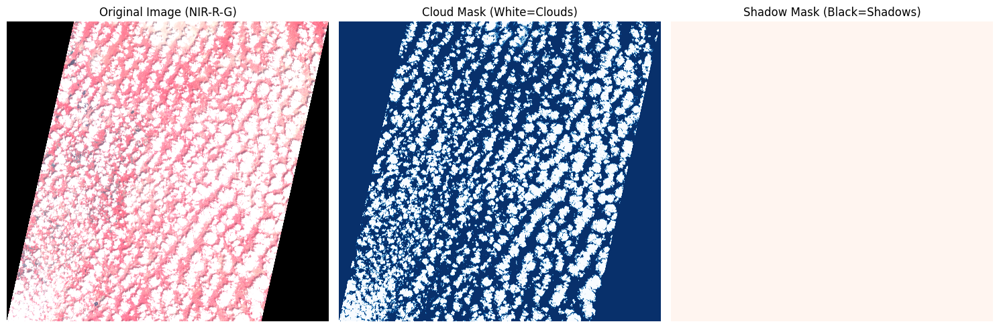

In [6]:
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import numpy as np

def plot_results(green_band_file, red_band_file, nir_band_file, cloud_mask_file, shadow_mask_file):
    """
    Plots:
    1. Original RGB image (using R, G, NIR for visualization)
    2. Cloud mask (white = clouds)
    3. Shadow mask (black = shadows)
    """
    # # Read the bands
    with rasterio.open(red_band_file) as r:
        red = r.read(1)
    with rasterio.open(green_band_file) as g:
        green = g.read(1)
    with rasterio.open(nir_band_file) as n:
        nir = n.read(1)
    
    # Create a false-color RGB (using NIR-R-G for better visualization)
    rgb_image = np.dstack((nir, red, green))
    
    # Normalize bands to 0-1 for better visualization
    # def normalize(band):
    #     return (band - np.min(band)) / (np.max(band) - np.min(band))
    
    # rgb_image[:, :, 0] = normalize(rgb_image[:, :, 0])  # NIR
    # rgb_image[:, :, 1] = normalize(rgb_image[:, :, 1])  # Red
    # rgb_image[:, :, 2] = normalize(rgb_image[:, :, 2])  # Green
    
    # Read masks
    with rasterio.open(cloud_mask_file) as c:
        cloud_mask = c.read(1)
    with rasterio.open(shadow_mask_file) as s:
        shadow_mask = s.read(1)
    
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original Image (NIR-R-G False Color)
    ax1.imshow(rgb_image)
    ax1.set_title('Original Image (NIR-R-G)')
    ax1.axis('off')
    
    # Cloud Mask (White = Clouds)
    ax2.imshow(cloud_mask, cmap='Blues_r')
    ax2.set_title('Cloud Mask (White=Clouds)')
    ax2.axis('off')
    
    # Shadow Mask (Black = Shadows)
    ax3.imshow(shadow_mask, cmap='Reds')  # Inverted grayscale
    ax3.set_title('Shadow Mask (Black=Shadows)')
    ax3.axis('off')
    
    plt.tight_layout()
    plt.show()

    # Overlay clouds (red) and shadows (blue)
    # fig, ax = plt.subplots(figsize=(10, 10))
    # ax.imshow(rgb_image, alpha=0.5)
    # ax.imshow(cloud_mask, cmap='Reds', alpha=1)
    # ax.imshow(shadow_mask, cmap='Blues', alpha=1)
    # ax.set_title('Clouds (Red) & Shadows (Blue) Overlay')
    # ax.axis('off')
    # plt.show()

# Example Usage
plot_results(
    green_band_file="/kaggle/input/raf16sep2024040353009000054/BAND2.tif",
    red_band_file="/kaggle/input/raf16sep2024040353009000054/BAND3.tif",
    nir_band_file="/kaggle/input/raf16sep2024040353009000054/BAND4.tif",
    cloud_mask_file= "/kaggle/working/cloud_mask_16sep.tif",
    shadow_mask_file= "/kaggle/working/shadow_mask_16sep.tif"
)

Cloud Mask Generated


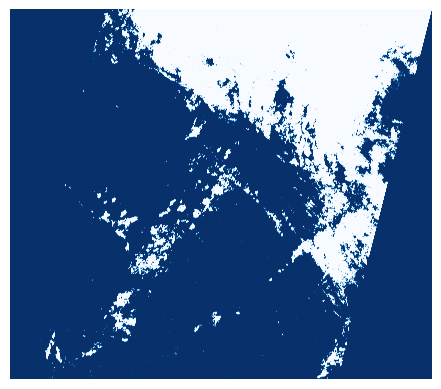

Prelim Cloud Shadow Mask generated


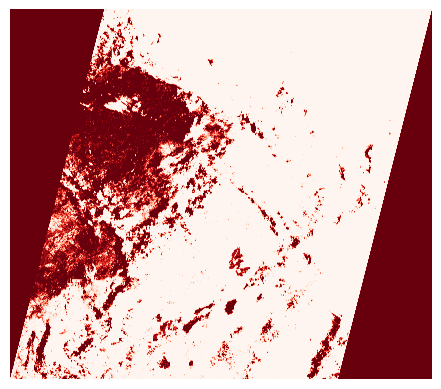

Refining Cloud Shadow Mask ...


Matching shadows:   1%|          | 802682/113453021 [04:02<9:39:08, 3241.87it/s] 

In [ ]:
import cv2
import cupy as cp
import numpy as np
import matplotlib.pyplot as plt
from math import sin, cos, radians
import time
from tqdm import tqdm
import rasterio

def cloud_shadow_detection_separate_bands(toa_file, T1, t2, t3, t4, T5, T6, T7, T8):
    with rasterio.open(toa_file) as src:
        toa_image = src.read()
        
    ci_1 = (3 * toa_image[2, :, :]) / (toa_image[1, :, :] + toa_image[0, :, :] + 1e-10)  
    ci_2 = (toa_image[0, :, :] + toa_image[1, :, :] + toa_image[2, :, :]) / 3  
    
    T2 = np.mean(ci_2) + (t2 * (np.max(ci_2) - np.mean(ci_2)))
    	
    prelim_cloud_mask = np.float32(np.logical_and(np.abs(ci_1 - 1) < T1, ci_2 > T2))
    final_cloud_mask = cv2.medianBlur(prelim_cloud_mask, T7)
    final_cloud_mask = np.expand_dims(final_cloud_mask, axis=2).astype(np.uint16)
    print('Cloud Mask Generated')
    plt.imshow(final_cloud_mask, cmap='Blues_r')
    plt.axis('off')
    plt.show()

    T3 = np.min(toa_image[2, :, :]) + (t3 * (np.mean(toa_image[2, :, :]) - np.min(toa_image[2, :, :])))  # NIR threshold
    T4 = np.min(toa_image[0, :, :]) + (t4 * (np.mean(toa_image[0, :, :]) - np.min(toa_image[0, :, :])))  # (G) threshold
    
    prelim_cloud_shadow_mask = np.float32(np.logical_and(toa_image[2, :, :] < T3, (toa_image[0, :, :]) < T4))
    print("Prelim Cloud Shadow Mask generated")
    plt.imshow(prelim_cloud_shadow_mask, cmap='Reds')
    plt.axis('off')
    plt.show()

    sun_azimuth = 99.389600
    # shadow_direction = np.radians(solar_azimuth + 180) 
    # refined_shadow_mask = np.zeros_like(prelim_cloud_shadow_mask, dtype=bool)
    # rows, cols = prelim_cloud_shadow_mask.shape
    window_height = T5
    window_width = T6
    
    # # Calculate window offsets (direction-aware)
    # dy = int(-window_height * np.sin(shadow_direction))  # Negative because shadows are cast opposite to the sun
    # dx = int(-window_height * np.cos(shadow_direction))
    # print("Refining Cloud Shadows")
    
    # # Iterate over all shadow candidate pixels
    # for y in range(rows):
    #     for x in range(cols):
    #         if prelim_cloud_shadow_mask[y, x] == 1:  # Only check pixels marked as shadow
    #             # Define search window bounds
    #             x_min = max(0, x + dx - window_width // 2)
    #             x_max = min(cols, x + dx + window_width // 2)
    #             y_min = max(0, y + dy - window_width // 2)
    #             y_max = min(rows, y + dy + window_width // 2)
                
    #             # Check if any cloud exists in the window
    #             cloud_window = final_cloud_mask[y_min:y_max, x_min:x_max]
    #             if np.any(cloud_window):
    #                 refined_shadow_mask[y, x] = 1  # Keep shadow if cloud is nearby
    
    # # Apply median filter to remove noise
    # refined_shadow_mask = median_filter(refined_shadow_mask.astype(np.uint8), size=T8)
    final_cloud_mask = np.squeeze(final_cloud_mask)
    rows, cols = final_cloud_mask.shape
    angle = (sun_azimuth + 180) % 360
    rad = radians(angle)
    dx = sin(rad)
    dy = -cos(rad)
    search_length = 30
    
    refined_shadow_mask = np.zeros_like(prelim_cloud_shadow_mask)
    print("Refining Cloud Shadow Mask ...")

    shadow_y, shadow_x = np.where(prelim_cloud_shadow_mask == 1)

    # for y0, x0 in zip(shadow_y, shadow_x):
    #     found_cloud = False
    #     for i in range(1, search_length + 1):
    #         x = int(round(x0 + dx * i))
    #         y = int(round(y0 + dy * i))
    #         if 0 <= x < cols and 0 <= y < rows:
    #             if final_cloud_mask[y, x] == 1:
    #                 found_cloud = True
    #                 break
    #     if found_cloud:
    #         refined_shadow_mask[y0, x0] = 1

    start = time.time()

    for y0, x0 in tqdm(zip(shadow_y, shadow_x), total=len(shadow_y), desc="Matching shadows"):
        found_cloud = False
        for i in range(1, search_length + 1):
            x = int(round(x0 + dx * i))
            y = int(round(y0 + dy * i))
            if 0 <= x < cols and 0 <= y < rows:
                if final_cloud_mask[y, x] == 1:
                    found_cloud = True
                    break
        if found_cloud:
            refined_shadow_mask[y0, x0] = 1

    print(f"Completed in {time.time() - start:.2f} seconds")

    plt.imshow(refined_shadow_mask, cmap='Reds')
    plt.axis('off')
    plt.show()
    
    # def normalize(band):
    #     band_min, band_max = np.nanmin(band), np.nanmax(band)
    #     return (band - band_min) / (band_max - band_min)

    # red = normalize(toa_image[2])
    # green = normalize(toa_image[1])
    # blue = normalize(toa_image[0])

    # # Stack the bands into an RGB image
    # rgb_image = np.dstack((red, green, blue))

    # fig, (ax1, ax2, ax3, ax4) = plt.subplots(2, 2, figsize=(15, 5))
    
    # ax1.imshow(rgb_image)
    # ax1.set_title('Original Image (NIR-R-G)')
    # ax1.axis('off')
    
    # ax2.imshow(final_cloud_mask, cmap='Blues_r')
    # ax2.set_title('Cloud Mask (White=Clouds)')
    # ax2.axis('off')

    # ax3.imshow(prelim_cloud_shadow_mask, cmap='Reds')
    # ax3.set_title('Prelim shadow Mask')
    # ax3.axis('off')

    # ax4.imshow(refined_shadow_mask, cmap='Reds')
    # ax4.set_title('refined shadow Mask')
    # ax4.axis('off')

cloud_shadow_detection_separate_bands(
    toa_file="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF22JUN2024039131009200052_TOA.tif",
    # output_cloud_mask_file=output_cloud_mask_file,
    # output_cloud_shadow_mask_file=output_shadow_mask_file,
    T1=1,    # Threshold for CI1 (adjust empirically)
    t2=0.05,    # Cloud sensitivity (higher = stricter)
    t3=0.9,    # Shadow sensitivity (higher = stricter)
    t4=0.7,
    T5=50,     # Search window height (spatial matching)
    T6=50,     # Search window width (spatial matching)
    T7=3,      # Median filter kernel size for clouds (must be odd)
    T8=3       # Median filter kernel size for shadows (must be odd)
)

In [4]:
# Define input and output file paths
green_band_file = "/kaggle/input/raf23mar2025043024009400045/BAND2.tif"   # e.g., Sentinel-2 Band 3 (Green)
red_band_file = "/kaggle/input/raf23mar2025043024009400045/BAND3.tif"       # e.g., Sentinel-2 Band 4 (Red)
nir_band_file = "/kaggle/input/raf23mar2025043024009400045/BAND4.tif"       # e.g., Sentinel-2 Band 8 (NIR)
output_cloud_mask_file = "/kaggle/working/cloud_mask_1.tif"
output_shadow_mask_file = "/kaggle/working/shadow_mask_1.tif"

# Call the function
cloud_mask, shadow_mask = cloud_shadow_detection_separate_bands(
    green_band_file=green_band_file,
    red_band_file=red_band_file,
    nir_band_file=nir_band_file,
    output_cloud_mask_file=output_cloud_mask_file,
    output_cloud_shadow_mask_file=output_shadow_mask_file,
    T1=1,    # Threshold for CI1 (adjust empirically)
    t2=0.01,    # Cloud sensitivity (higher = stricter)
    t3=1,    # Shadow sensitivity (higher = stricter)
    t4=1,
    T5=150,     # Search window height (spatial matching)
    T6=200,     # Search window width (spatial matching)
    T7=3,      # Median filter kernel size for clouds (must be odd)
    T8=3       # Median filter kernel size for shadows (must be odd)
)

print("Cloud and shadow masks saved successfully!")

Original band:  (16925, 17875)
prelim_cloud_mask:  (16925, 17875)
final_cloud_mask:  (16925, 17875)
final_cloud_mask:  (16925, 17875, 1)
final_cloud_shadow_mask:  (16925, 17875, 1)
Cloud and shadow masks saved successfully!


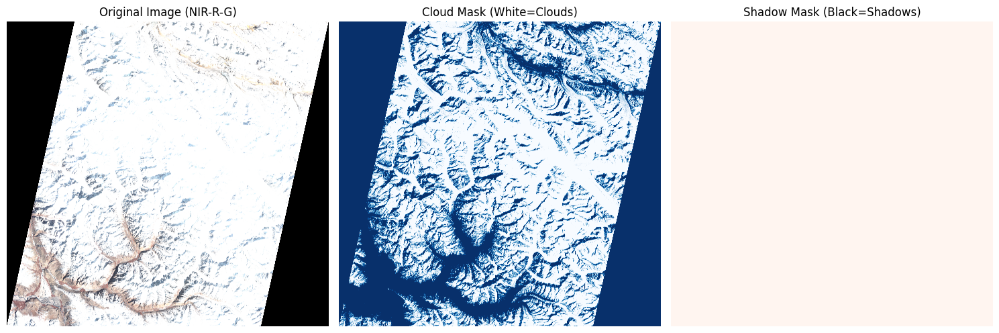

In [5]:
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import numpy as np

def plot_results(green_band_file, red_band_file, nir_band_file, cloud_mask_file, shadow_mask_file):
    """
    Plots:
    1. Original RGB image (using R, G, NIR for visualization)
    2. Cloud mask (white = clouds)
    3. Shadow mask (black = shadows)
    """
    # Read the bands
    with rasterio.open(red_band_file) as r:
        red = r.read(1)
    with rasterio.open(green_band_file) as g:
        green = g.read(1)
    with rasterio.open(nir_band_file) as n:
        nir = n.read(1)
    
    # Create a false-color RGB (using NIR-R-G for better visualization)
    rgb_image = np.dstack((nir, red, green))
    
    # Normalize bands to 0-1 for better visualization
    # def normalize(band):
    #     return (band - np.min(band)) / (np.max(band) - np.min(band))
    
    # rgb_image[:, :, 0] = normalize(rgb_image[:, :, 0])  # NIR
    # rgb_image[:, :, 1] = normalize(rgb_image[:, :, 1])  # Red
    # rgb_image[:, :, 2] = normalize(rgb_image[:, :, 2])  # Green
    
    # Read masks
    with rasterio.open(cloud_mask_file) as c:
        cloud_mask = c.read(1)
    with rasterio.open(shadow_mask_file) as s:
        shadow_mask = s.read(1)
    
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original Image (NIR-R-G False Color)
    ax1.imshow(rgb_image)
    ax1.set_title('Original Image (NIR-R-G)')
    ax1.axis('off')
    
    # Cloud Mask (White = Clouds)
    ax2.imshow(cloud_mask, cmap='Blues_r')
    ax2.set_title('Cloud Mask (White=Clouds)')
    ax2.axis('off')
    
    # Shadow Mask (Black = Shadows)
    ax3.imshow(shadow_mask, cmap='Reds')  # Inverted grayscale
    ax3.set_title('Shadow Mask (Black=Shadows)')
    ax3.axis('off')
    
    plt.tight_layout()
    plt.show()

    # Overlay clouds (red) and shadows (blue)
    # fig, ax = plt.subplots(figsize=(10, 10))
    # ax.imshow(rgb_image, alpha=0.5)
    # ax.imshow(cloud_mask, cmap='Reds', alpha=1)
    # ax.imshow(shadow_mask, cmap='Blues', alpha=1)
    # ax.set_title('Clouds (Red) & Shadows (Blue) Overlay')
    # ax.axis('off')
    # plt.show()

# Example Usage
plot_results(
    green_band_file="/kaggle/input/raf23mar2025043024009400045/BAND2.tif",
    red_band_file="/kaggle/input/raf23mar2025043024009400045/BAND3.tif",
    nir_band_file="/kaggle/input/raf23mar2025043024009400045/BAND4.tif",
    cloud_mask_file= "/kaggle/working/cloud_mask_1.tif",
    shadow_mask_file= "/kaggle/working/shadow_mask_1.tif"
)

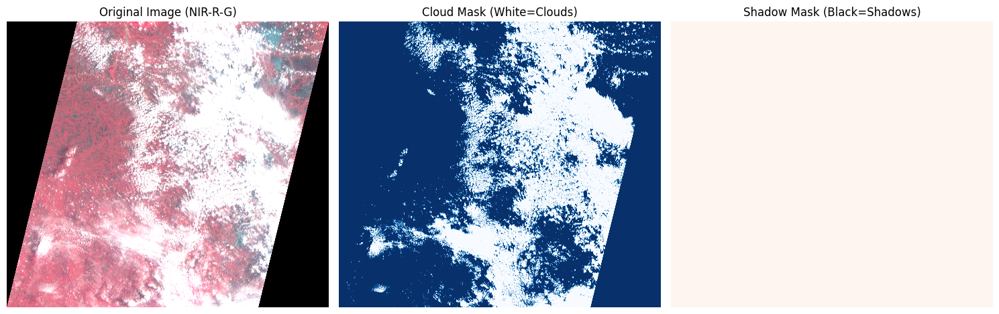

In [5]:
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import numpy as np

def plot_results(green_band_file, red_band_file, nir_band_file, cloud_mask_file, shadow_mask_file):
    """
    Plots:
    1. Original RGB image (using R, G, NIR for visualization)
    2. Cloud mask (white = clouds)
    3. Shadow mask (black = shadows)
    """
    # Read the bands
    with rasterio.open(red_band_file) as r:
        red = r.read(1)
    with rasterio.open(green_band_file) as g:
        green = g.read(1)
    with rasterio.open(nir_band_file) as n:
        nir = n.read(1)
    
    # Create a false-color RGB (using NIR-R-G for better visualization)
    rgb_image = np.dstack((nir, red, green))
    
    # Normalize bands to 0-1 for better visualization
    # def normalize(band):
    #     return (band - np.min(band)) / (np.max(band) - np.min(band))
    
    # rgb_image[:, :, 0] = normalize(rgb_image[:, :, 0])  # NIR
    # rgb_image[:, :, 1] = normalize(rgb_image[:, :, 1])  # Red
    # rgb_image[:, :, 2] = normalize(rgb_image[:, :, 2])  # Green
    
    # Read masks
    with rasterio.open(cloud_mask_file) as c:
        cloud_mask = c.read(1)
    with rasterio.open(shadow_mask_file) as s:
        shadow_mask = s.read(1)
    
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original Image (NIR-R-G False Color)
    ax1.imshow(rgb_image)
    ax1.set_title('Original Image (NIR-R-G)')
    ax1.axis('off')
    
    # Cloud Mask (White = Clouds)
    ax2.imshow(cloud_mask, cmap='Blues_r')
    ax2.set_title('Cloud Mask (White=Clouds)')
    ax2.axis('off')
    
    # Shadow Mask (Black = Shadows)
    ax3.imshow(shadow_mask, cmap='Reds')  # Inverted grayscale
    ax3.set_title('Shadow Mask (Black=Shadows)')
    ax3.axis('off')
    
    plt.tight_layout()
    plt.show()

    # Overlay clouds (red) and shadows (blue)
    # fig, ax = plt.subplots(figsize=(10, 10))
    # ax.imshow(rgb_image, alpha=0.5)
    # ax.imshow(cloud_mask, cmap='Reds', alpha=1)
    # ax.imshow(shadow_mask, cmap='Blues', alpha=1)
    # ax.set_title('Clouds (Red) & Shadows (Blue) Overlay')
    # ax.axis('off')
    # plt.show()

# Example Usage
plot_results(
    green_band_file="/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND2.tif",
    red_band_file="/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND3.tif",
    nir_band_file="/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND4.tif",
    cloud_mask_file= "/kaggle/working/cloud_mask.tif",
    shadow_mask_file= "/kaggle/working/shadow_mask.tif"
)

In [19]:
# Define input and output file paths
green_band_file = "/kaggle/input/r2f15jun2024068272009300044ssanstuc00gtdd/BAND2.tif"   # e.g., Sentinel-2 Band 3 (Green)
red_band_file = "/kaggle/input/r2f15jun2024068272009300044ssanstuc00gtdd/BAND3.tif"       # e.g., Sentinel-2 Band 4 (Red)
nir_band_file = "/kaggle/input/r2f15jun2024068272009300044ssanstuc00gtdd/BAND4.tif"       # e.g., Sentinel-2 Band 8 (NIR)
output_cloud_mask_file = "/kaggle/working/cloud_mask_2.tif"
output_shadow_mask_file = "/kaggle/working/shadow_mask_2.tif"

# Call the function
cloud_mask, shadow_mask = cloud_shadow_detection_separate_bands(
    green_band_file=green_band_file,
    red_band_file=red_band_file,
    nir_band_file=nir_band_file,
    output_cloud_mask_file=output_cloud_mask_file,
    output_cloud_shadow_mask_file=output_shadow_mask_file,
    T1=1,    # Threshold for CI1 (adjust empirically)
    t2=0.1,    # Cloud sensitivity (higher = stricter)
    t3=0.75,    # Shadow sensitivity (higher = stricter)
    t4=0.5,
    T5=150,     # Search window height (spatial matching)
    T6=100,     # Search window width (spatial matching)
    T7=3,      # Median filter kernel size for clouds (must be odd)
    T8=3       # Median filter kernel size for shadows (must be odd)
)

print("Cloud and shadow masks saved successfully!")

Cloud and shadow masks saved successfully!


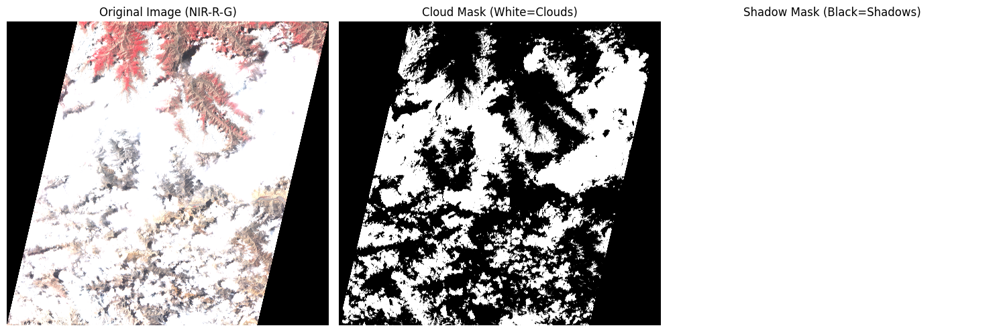

In [20]:
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import numpy as np

def plot_results(green_band_file, red_band_file, nir_band_file, cloud_mask_file, shadow_mask_file):
    """
    Plots:
    1. Original RGB image (using R, G, NIR for visualization)
    2. Cloud mask (white = clouds)
    3. Shadow mask (black = shadows)
    """
    # Read the bands
    with rasterio.open(red_band_file) as r:
        red = r.read(1)
    with rasterio.open(green_band_file) as g:
        green = g.read(1)
    with rasterio.open(nir_band_file) as n:
        nir = n.read(1)
    
    # Create a false-color RGB (using NIR-R-G for better visualization)
    rgb_image = np.dstack((nir, red, green))
    
    # Normalize bands to 0-1 for better visualization
    # def normalize(band):
    #     return (band - np.min(band)) / (np.max(band) - np.min(band))
    
    # rgb_image[:, :, 0] = normalize(rgb_image[:, :, 0])  # NIR
    # rgb_image[:, :, 1] = normalize(rgb_image[:, :, 1])  # Red
    # rgb_image[:, :, 2] = normalize(rgb_image[:, :, 2])  # Green
    
    # Read masks
    with rasterio.open(cloud_mask_file) as c:
        cloud_mask = c.read(1)
    with rasterio.open(shadow_mask_file) as s:
        shadow_mask = s.read(1)
    
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original Image (NIR-R-G False Color)
    ax1.imshow(rgb_image)
    ax1.set_title('Original Image (NIR-R-G)')
    ax1.axis('off')
    
    # Cloud Mask (White = Clouds)
    ax2.imshow(cloud_mask, cmap='gray')
    ax2.set_title('Cloud Mask (White=Clouds)')
    ax2.axis('off')
    
    # Shadow Mask (Black = Shadows)
    ax3.imshow(shadow_mask, cmap='gray_r')  # Inverted grayscale
    ax3.set_title('Shadow Mask (Black=Shadows)')
    ax3.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example Usage
plot_results(
    green_band_file="/kaggle/input/r2f15jun2024068272009300044ssanstuc00gtdd/BAND2.tif",
    red_band_file="/kaggle/input/r2f15jun2024068272009300044ssanstuc00gtdd/BAND3.tif",
    nir_band_file="/kaggle/input/r2f15jun2024068272009300044ssanstuc00gtdd/BAND4.tif",
    cloud_mask_file= "/kaggle/working/cloud_mask_2.tif",
    shadow_mask_file= "/kaggle/working/shadow_mask_2.tif"
)

In [5]:
import rasterio
import numpy as np
import cv2
from scipy.ndimage import distance_transform_edt

# Load bands (Green, Red, NIR)
# with rasterio.open('satellite_image.tif') as src:
#     green = src.read(1)
#     red = src.read(2)
#     nir = src.read(3)
#     transform = src.transform  # Spatial resolution (pixel size in meters)
#     crs = src.crs  # Coordinate system

with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND3.tif") as r:
    red = r.read(1)
    metadata = r.profile
with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND2.tif") as g:
    green = g.read(1)
with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND4.tif") as n:
    nir = n.read(1)

print("NIR Shape:", nir.shape)
# Load cloud mask (binary: 1=cloud, 0=no cloud)
cloud_mask = rasterio.open('/kaggle/working/cloud_mask_3.tif').read(1).astype(bool)
print("Cloud mask Shape:", cloud_mask.shape)

# Solar angles (degrees)
solar_zenith = 69.542931  # Example (from metadata)
solar_azimuth = 100.452774 # Example (from metadata)
shadow_direction = (solar_azimuth + 180) % 360  # Opposite of sun direction
print("solar zenith angle", solar_zenith)
print("solar azimuth angle", solar_azimuth)
print("shadow direction", shadow_direction)

# Compute NIR threshold (shadows have low NIR reflectance)
nir_threshold = np.percentile(nir, 5)  # Adjust based on image
shadow_mask = (nir < nir_threshold) & (~cloud_mask)

# Optional: Use NDVI to avoid false shadows (vegetation is dark in NIR)
ndvi = (nir - red) / (nir + red + 1e-10)
shadow_mask = shadow_mask & (ndvi < 0.2)  # Adjust threshold
print("Thresholded mask using NDVI -- DONE")

max_cloud_height = 10000  # Adjust based on your scene (e.g., 10 km)
# Get pixel size from metadata (e.g., 10 meters)
pixel_size = 5.8  # Assumes square pixels, SPATIAL RESOLUTION: 5.8M
# Compute max displacement in pixels
max_displacement = max_cloud_height / (np.tan(np.deg2rad(solar_zenith)) * pixel_size)
max_displacement = int(np.round(max_displacement))
print("max_displacement_for_clouds:", max_displacement)

# Convert shadow direction to (x, y) shift in pixels
angle_rad = np.deg2rad(shadow_direction)
dx = int(np.round(np.sin(angle_rad) * max_displacement))
dy = int(np.round(-np.cos(angle_rad) * max_displacement))  # Negative since y-axis is downward

# Shift cloud mask to estimate shadow location
shifted_cloud = np.roll(cloud_mask, (dy, dx), axis=(0, 1))

# Find overlapping regions (possible cloud-shadow pairs)
cloud_shadow_pairs = shifted_cloud & shadow_mask

print("Acquired Cloud Shadow pairs -- DONE")

# Use distance transform to find closest shadow for each cloud
distance_to_shadow = distance_transform_edt(~shadow_mask)
cloud_displacement = np.where(cloud_mask, distance_to_shadow, 0)

# Convert pixel displacement to meters
# pixel_size = 5.8  # Assuming square pixels (e.g., 10m)
displacement_meters = cloud_displacement * pixel_size

# Compute cloud height (h = d * tan(θ))
cloud_height = displacement_meters * np.tan(np.deg2rad(solar_zenith))
print("cloud height", cloud_height)

# Mask invalid values (no shadow found)
cloud_height[~cloud_mask] = np.nan

# Save cloud height as GeoTIFF
with rasterio.open(
    '/kaggle/working/cloud_height.tif',
    'w',
    **metadata
) as dst:
    dst.write(cloud_height, 1)

NIR Shape: (16173, 18237)
Cloud mask Shape: (16173, 18237)
solar zenith angle 69.542931
solar azimuth angle 100.452774
shadow direction 280.452774
Thresholded mask using NDVI -- DONE
max_displacement_for_clouds: 643
Acquired Cloud Shadow pairs -- DONE
cloud height [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


/usr/local/lib/python3.11/dist-packages/numpy/core/_asarray.py:126: RuntimeWarning: invalid value encountered in cast
  arr = array(a, dtype=dtype, order=order, copy=False, subok=subok)


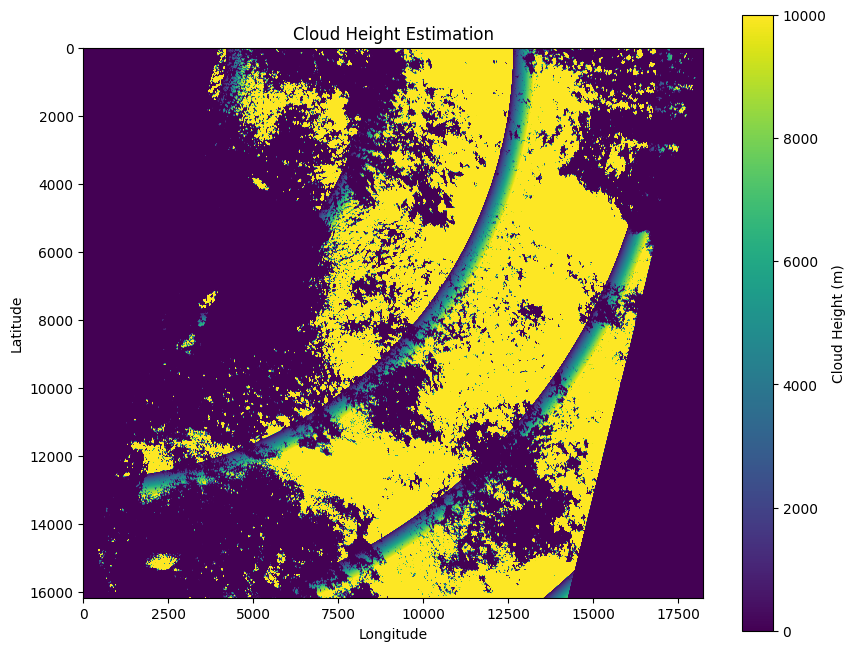

In [6]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

# Load the cloud height TIFF file
with rasterio.open('cloud_height.tif') as src:
    cloud_height = src.read(1)  # Read the first band
    bounds = src.bounds  # Get geographic bounds

# Plot the cloud height
plt.figure(figsize=(10, 8))
img = plt.imshow(cloud_height, cmap='viridis', vmin=0, vmax=10000)  # Adjust vmax based on your data
plt.colorbar(img, label='Cloud Height (m)')
plt.title('Cloud Height Estimation')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

CLOUD MASK --- DONE
FINAL SHADOW --- DONE
FINAL CLOUD & SHADOW MASK SAVED


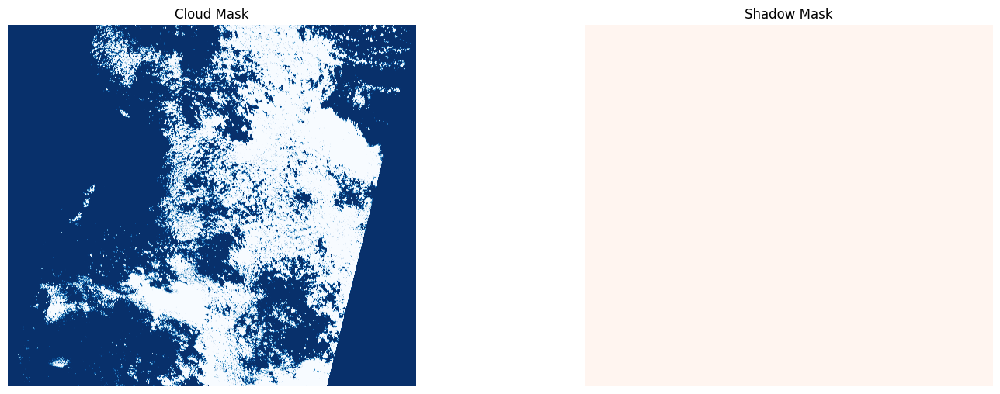

In [1]:
import cv2
import numpy as np
import rasterio

def optimized_shadow_detection(
    green_band_file, red_band_file, nir_band_file, 
    output_cloud_mask_file, output_cloud_shadow_mask_file,
    T1=0.5, t2=0.5, t3=0.3, t4=0.3,  # Threshold parameters
    T5=11, T6=11, T7=5, T8=5,        # Filtering parameters
    projection_distance=20,           # Cloud-shadow distance
    min_shadow_size=50                # Minimum shadow area in pixels
):
    # Read bands (same as before)
    with rasterio.open(green_band_file) as g:
        green = g.read(1)
        metadata = g.profile
    
    with rasterio.open(red_band_file) as r:
        red = r.read(1)
    
    with rasterio.open(nir_band_file) as n:
        nir = n.read(1)
    
    img = np.dstack((green, red, nir))
    
    # Cloud Detection (unchanged)
    ci_1 = (3 * img[:, :, 2]) / (img[:, :, 1] + img[:, :, 0] + 1e-10)
    ci_2 = (img[:, :, 0] + img[:, :, 1] + img[:, :, 2]) / 3
    T2 = np.mean(ci_2) + (t2 * (np.max(ci_2) - np.mean(ci_2)))
    prelim_cloud_mask = np.float32(np.logical_and(np.abs(ci_1 - 1) < T1, ci_2 > T2))
    final_cloud_mask = cv2.medianBlur(prelim_cloud_mask, T7)
    final_cloud_mask = np.expand_dims(final_cloud_mask, axis=2).astype(np.uint16)
    print("CLOUD MASK --- DONE")
    # OPTIMIZED SHADOW DETECTION
    # 1. Calculate NDSI
    # NDSI = (img[:, :, 0] - img[:, :, 2]) / (img[:, :, 0] + img[:, :, 2] + 1e-10)
    
    # 2. Automatic thresholding
    # def auto_threshold(image, percentile=5):
    #     return np.percentile(image[image > 0], percentile)
    
    # T3 = auto_threshold(img[:, :, 2], percentile=5)  # NIR threshold
    # T4 = auto_threshold(img[:, :, 0], percentile=5)  # G+R threshold
    
    # # 3. Cloud projection
    # cloud_projection = np.zeros_like(final_cloud_mask)
    # cloud_projection[projection_distance:] = final_cloud_mask[:-projection_distance]
    
    # # 4. Preliminary shadow mask
    # prelim_shadow_mask = np.float32(np.logical_and(
    #     # NDSI > 0.2,  # NDSI threshold
    #     (img[:, :, 2] < T3), ((img[:, :, 0]) < T4)
    # ))
    
    # # 5. Combine with cloud projection
    # refined_shadow_mask = prelim_shadow_mask * cloud_projection.squeeze()
    # print("REFINED SHADOW --- DONE")

    # # 6. Post-processing
    # kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    # refined_shadow_mask = cv2.morphologyEx(refined_shadow_mask, cv2.MORPH_OPEN, kernel)
    
    # # Size filtering
    # n_labels, labels, stats, _ = cv2.connectedComponentsWithStats(refined_shadow_mask.astype(np.uint8))
    # final_shadow_mask = np.zeros_like(refined_shadow_mask)
    # for i in range(1, n_labels):
    #     if stats[i, cv2.CC_STAT_AREA] >= min_shadow_size:
    #         final_shadow_mask[labels == i] = 1
    
    # final_shadow_mask = np.expand_dims(final_shadow_mask, axis=2).astype(np.uint8)
    # print("FINAL SHADOW --- DONE")

    # Shadow Detection (Using NIR and (R + G) instead of Blue band)
    # T3 = np.min(img[:, :, 2]) + (t3 * (np.mean(img[:, :, 2]) - np.min(img[:, :, 2])))  # NIR threshold
    # # T4 = np.min(img[:, :, 0] + img[:, :, 1]) + (t4 * (np.mean(img[:, :, 0] + img[:, :, 1]) - np.min(img[:, :, 0] + img[:, :, 1])))  # (G + R) threshold

    # # prelim_cloud_shadow_mask = np.float32(np.logical_and(img[:, :, 2] < T3, (img[:, :, 0] + img[:, :, 1]) < T4))
    # prelim_cloud_shadow_mask = np.float32(img[:, :, 2] < T3)

    # print("PRELIM SHADOW --- DONE")

    # # Morphological operations to refine shadow mask
    # kernel = np.ones((3, 3), np.uint8)  # Adjust kernel size as needed
    # prelim_cloud_shadow_mask = cv2.morphologyEx(prelim_cloud_shadow_mask, cv2.MORPH_CLOSE, kernel)

    # # Spatial matching to refine shadow mask
    # spatial_search_kernel = np.ones((T5, T6), dtype=np.float32)
    # non_pseudo_cloud_shadow_position_mask = cv2.filter2D(final_cloud_mask, -1, spatial_search_kernel) < 0

    # refined_cloud_shadow_mask = prelim_cloud_shadow_mask * non_pseudo_cloud_shadow_position_mask
    # print("REFINED SHADOW --- DONE")
    # final_cloud_shadow_mask = cv2.medianBlur(refined_cloud_shadow_mask, T8)
    # final_cloud_shadow_mask = np.expand_dims(final_cloud_shadow_mask, axis=2).astype(np.uint8)
    # print("FINAL SHADOW --- DONE")
    T3 = np.min(img[:, :, 2]) + (t3 * (np.mean(img[:, :, 2]) - np.min(img[:, :, 2])))  # NIR threshold
    T4 = np.min(img[:, :, 0]) + (t4 * (np.mean(img[:, :, 0]) - np.min(img[:, :, 0])))  # (G + R) threshold
    
    prelim_cloud_shadow_mask = np.float32(np.logical_and(img[:, :, 2] < T3, img[:, :, 0] < T4))
    # Create a structuring element for morphological operations
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (T5, T6))
    spatial_search_kernel = np.ones((T5, T6), dtype=np.float32)
    # Morphological closing to fill small holes in the shadow mask
    closed_shadow_mask = cv2.morphologyEx(prelim_cloud_shadow_mask, cv2.MORPH_CLOSE, kernel)
    # Morphological opening to remove small noise
    refined_cloud_shadow_mask = cv2.morphologyEx(closed_shadow_mask, cv2.MORPH_OPEN, kernel)
    # Combine with non-pseudo cloud shadow position mask
    non_pseudo_cloud_shadow_position_mask = cv2.filter2D(final_cloud_mask, -1, spatial_search_kernel) < 0
    refined_cloud_shadow_mask = refined_cloud_shadow_mask * non_pseudo_cloud_shadow_position_mask
    # Apply median blur to the refined shadow mask
    final_cloud_shadow_mask = cv2.medianBlur(refined_cloud_shadow_mask, T8)
    final_cloud_shadow_mask = np.expand_dims(final_cloud_shadow_mask, axis=2).astype(np.uint8)
    print("FINAL SHADOW --- DONE")
    # Save outputs
    metadata['count'] = 1
    metadata['dtype'] = 'uint8'
    
    with rasterio.open(output_cloud_mask_file, 'w', **metadata) as dst:
        dst.write(final_cloud_mask.transpose(2, 0, 1))
        
    with rasterio.open(output_cloud_shadow_mask_file, 'w', **metadata) as dst2:
        dst2.write(final_cloud_shadow_mask.transpose(2, 0, 1))

    print("FINAL CLOUD & SHADOW MASK SAVED")
    return final_cloud_mask, final_cloud_shadow_mask


import matplotlib.pyplot as plt
import numpy as np

def plot_results(cloud_mask, shadow_mask, figsize=(15, 10)):
    """Visualize the original image and detection results."""
    plt.figure(figsize=figsize)
    
    # Create RGB composite (using G, R, NIR bands - NIR as red for false color)
    # rgb_img = np.dstack((
    #     original_img[:, :, 1],  # Red band as green
    #     original_img[:, :, 0],  # Green band as blue
    #     original_img[:, :, 2]   # NIR band as red
    # ))
    
    # Normalize for display
    # rgb_img = (rgb_img - rgb_img.min()) / (rgb_img.max() - rgb_img.min())
    
    # Plot original image
    # plt.subplot(2, 2, 1)
    # plt.imshow(rgb_img)
    # plt.title('False Color Composite (NIR-R-G)')
    # plt.axis('off')
    
    # Plot cloud mask
    plt.subplot(2, 2, 1)
    plt.imshow(cloud_mask.squeeze(), cmap='Blues_r')
    plt.title('Cloud Mask')
    plt.axis('off')
    
    # Plot shadow mask
    plt.subplot(2, 2, 2)
    plt.imshow(shadow_mask.squeeze(), cmap='Reds')
    plt.title('Shadow Mask')
    plt.axis('off')
    
    # Plot overlay
    # plt.subplot(2, 2, 4)
    # plt.imshow(rgb_img)
    # plt.imshow(cloud_mask.squeeze(), cmap='Blues', alpha=0.3)
    # plt.imshow(shadow_mask.squeeze(), cmap='Reds', alpha=0.3)
    # plt.title('Combined Detection')
    # plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example function call with test data
if __name__ == "__main__":
    # Example file paths (replace with your actual files)
    green_band = "/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND2.tif"
    red_band = "/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND3.tif"
    nir_band = "/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND4.tif"
    
    # Output paths
    cloud_output = "/kaggle/working/cloud_mask.tif"
    shadow_output = "/kaggle/working/shadow_mask.tif"
    
    # Call the optimized function
    cloud_mask, shadow_mask = optimized_shadow_detection(
        green_band_file=green_band,
        red_band_file=red_band,
        nir_band_file=nir_band,
        output_cloud_mask_file=cloud_output,
        output_cloud_shadow_mask_file=shadow_output,
        T1=1,         # CI1 threshold
        t2=0.01,         # Cloud sensitivity
        t3=1,         # Shadow sensitivity (NIR)
        t4=1,         # Shadow sensitivity (G+R)
        T5=11,          # Search window width
        T6=11,          # Search window height
        T7=5,           # Cloud median filter size
        T8=5,           # Shadow median filter size
        projection_distance=5,  # Cloud-shadow distance in pixels
        min_shadow_size=5       # Minimum shadow area in pixels
    )
    
    # Read the original image for visualization
    with rasterio.open(green_band) as g:
        green = g.read(1)
    with rasterio.open(red_band) as r:
        red = r.read(1)
    with rasterio.open(nir_band) as n:
        nir = n.read(1)
    # original_img = np.dstack((green, red, nir))
    
    # Visualize results
    plot_results(cloud_mask, shadow_mask)

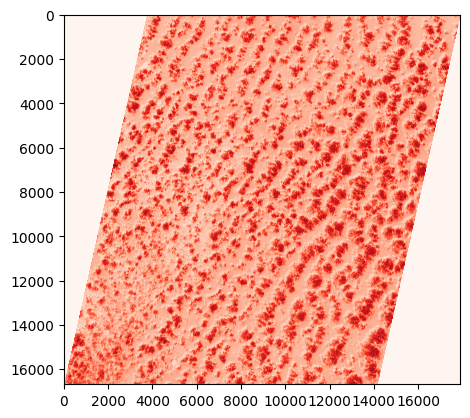

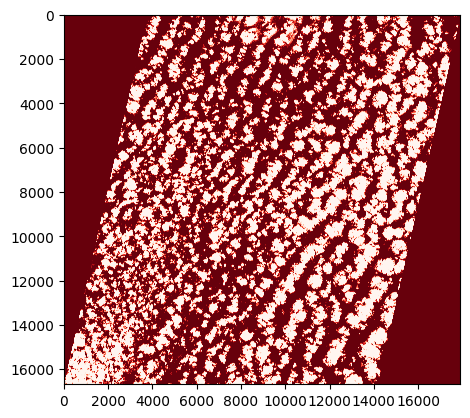

np.max(luminosity) 882.2
Threshold 132.33


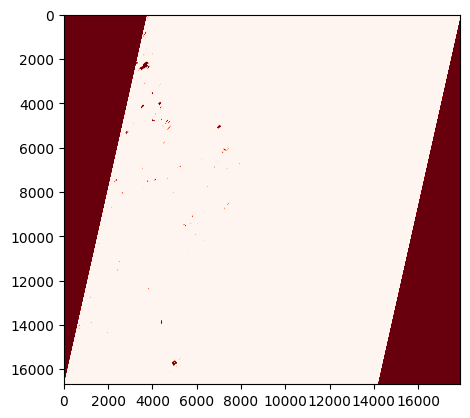

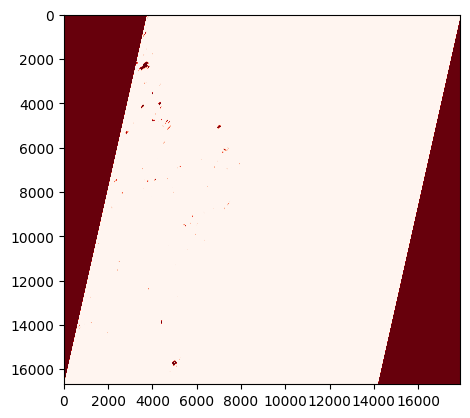

In [7]:
import numpy as np
import rasterio
from scipy import stats

def compute_luminosity_mask(G, R, NIR):
    """Compute RMS-based luminosity mask."""
    return np.sqrt((G**2 + R**2 + NIR**2) / 3)

def get_cloudless_pixels(cloud_mask):
    """Return mask of cloud-free pixels (inverse of cloud mask)."""
    return ~cloud_mask

def compute_dynamic_threshold(luminosity, cloudless_mask, shadow_percentile=15):
    """
    Compute threshold for shadow detection:
    - Use cloudless pixels to avoid cloud interference.
    - Take values between 1st and 99th percentiles to remove outliers.
    - Set threshold at 15% of this range.
    """
    cloudless_luminosity = luminosity[cloudless_mask]
    
    # Get 1st and 99th percentiles (to exclude outliers)
    p1, p99 = np.percentile(cloudless_luminosity, [1, 99])
    trimmed_luminosity = cloudless_luminosity[
        (cloudless_luminosity >= p1) & (cloudless_luminosity <= p99)
    ]
    
    # Compute threshold (15% of the trimmed range)
    luminosity_min = np.min(trimmed_luminosity)
    luminosity_max = np.max(trimmed_luminosity)
    threshold = luminosity_min + (shadow_percentile / 100) * (luminosity_max - luminosity_min)
    
    return threshold

# Load bands and cloud mask (assuming cloud_mask is a boolean array where True = cloud)
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND2.tif") as src:
    G = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND3.tif") as src:
    R = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND4.tif") as src:
    NIR = src.read(1).astype(float)
with rasterio.open('/kaggle/working/cloud_mask_16sep.tif') as src:
    cloud_mask = src.read(1).astype(bool)

# Step 1: Compute luminosity mask (RMS of bands)
# luminosity = compute_luminosity_mask(G, R, NIR)
luminosity = (0.2*G + 0.3*R + 0.5*NIR)
plt.imshow(luminosity, cmap='Reds')
plt.show()

# Step 2: Get cloudless pixels (to avoid cloud interference)
cloudless_mask = np.logical_not(cloud_mask)
plt.imshow(cloudless_mask, cmap='Reds')
plt.show()

# Step 3: Compute dynamic threshold (15% of cloudless luminosity range)
# threshold = compute_dynamic_threshold(luminosity, cloudless_mask, shadow_percentile=15)
threshold = 0.15 * np.max(luminosity)
print("np.max(luminosity)",np.max(luminosity))
print("Threshold", threshold)
# Step 4: Extract shadow candidates (darkest pixels below threshold)
shadow_candidates = (luminosity < threshold) & cloudless_mask

plt.imshow(shadow_candidates, cmap='Reds')
plt.show()

# ndvi = (NIR - R) / (R + NIR + 1e-10) 
# corrected_shadow_candidates = shadow_candidates & ndvi 

# Optional: Apply morphological operations to clean up noise
from scipy.ndimage import binary_closing, binary_opening
shadow_candidates_cleaned = binary_closing(binary_opening(shadow_candidates))

# Save output
# profile = src.profile  # Copy metadata from input
# profile.update(dtype=rasterio.uint8, count=1, nodata=0)

# with rasterio.open('shadow_candidates.tif', 'w', **profile) as dst:
#     dst.write(shadow_candidates_cleaned.astype(np.uint8), 1)

plt.imshow(shadow_candidates_cleaned, cmap='Reds')
plt.show()

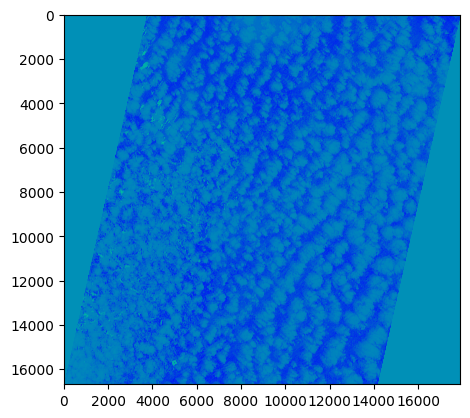

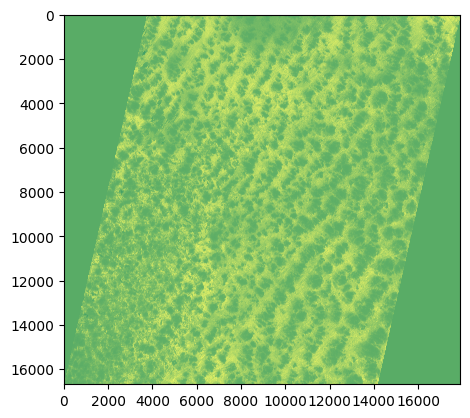

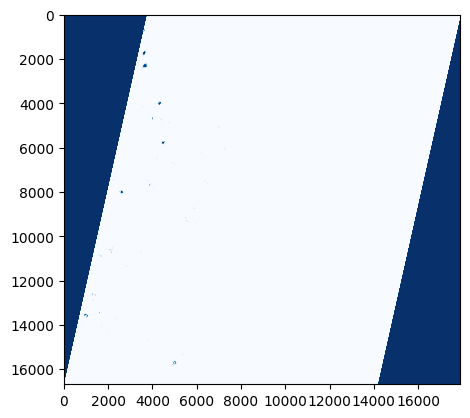

In [8]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt

def compute_ndwi(G, NIR):
    """Compute NDWI: (Green - NIR) / (Green + NIR)."""
    return (G - NIR) / (G + NIR + 1e-10)  # Avoid division by zero

# Load bands
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND2.tif") as src:
    G = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND3.tif") as src:
    R = src.read(1).astype(float)  
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND4.tif") as src:
    NIR = src.read(1).astype(float)

# Compute NDWI
ndwi = compute_ndwi(G, NIR)
plt.imshow(ndwi, cmap='winter')
plt.show()

ndvi = (NIR - R) / (R + NIR + 1e-10) 
plt.imshow(ndvi, cmap='summer')
plt.show()

# Threshold NDWI (adjust based on your scene)
# water_mask = np.float32(ndwi > 0.1) # Typical threshold for water
# Define individual conditions
cond1 = ndwi > 0.1
cond2 = (ndvi < 0.01) & (R < 0.11)
cond3 = (ndvi < 0.1) & (R < 0.05)

# Combine conditions and convert to float32
water_mask = np.float32(cond1 | cond2 | cond3)

# Save output
# profile = src.profile  # Copy metadata
# profile.update(dtype=rasterio.uint8, count=1, nodata=0)

# with rasterio.open('water_mask_ndwi.tif', 'w', **profile) as dst:
#     dst.write(water_mask_ndwi.astype(np.uint8), 1)
plt.imshow(water_mask, cmap='Blues')
plt.show()

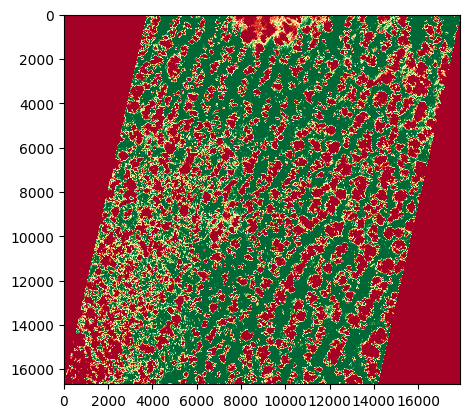

In [9]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt

def compute_ndwi(G, NIR):
    """Compute NDWI: (Green - NIR) / (Green + NIR)."""
    return (G - NIR) / (G + NIR + 1e-10)  # Avoid division by zero

# Load bands
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND2.tif") as src:
    G = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND3.tif") as src:
    R = src.read(1).astype(float)  
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND4.tif") as src:
    NIR = src.read(1).astype(float)

# Compute NDWI
# ndwi = compute_ndwi(G, NIR)
# plt.imshow(ndwi, cmap='Blues')
# plt.show()

# ndvi = (NIR - R) / (R + NIR + 1e-10) 
# plt.imshow(ndvi, cmap='Spectral_r')
# plt.show()

# EVI = 2.5 * (NIR  - R)/(NIR + (6 * R) - (7.5 * G) + 1) + 1e-10
savi = ((NIR - R)/(NIR + R + 0.5)) * 1.5
thres_savi = savi > 0.2
plt.imshow(thres_savi, cmap='RdYlGn')
plt.show()

# Threshold NDWI (adjust based on your scene)
# water_mask = np.float32(ndwi > 0.1) # Typical threshold for water
# Define individual conditions
# cond1 = ndwi > 0.1
# cond2 = (ndvi < 0.01) & (R < 0.11)
# cond3 = (ndvi < 0.1) & (R < 0.05)

# Combine conditions and convert to float32
# water_mask = np.float32(cond1 | cond2 | cond3)

# Save output
# profile = src.profile  # Copy metadata
# profile.update(dtype=rasterio.uint8, count=1, nodata=0)

# with rasterio.open('water_mask_ndwi.tif', 'w', **profile) as dst:
#     dst.write(water_mask_ndwi.astype(np.uint8), 1)
# plt.imshow(water_mask, cmap='Blues')
# plt.show()

In [1]:
import numpy as np
import rasterio
from scipy import stats
from skimage.morphology import remove_small_objects

def compute_luminosity_mask(G, R, NIR):
    return np.sqrt((G**2 + R**2 + NIR**2) / 3)

with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND2.tif") as src:
    G = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND3.tif") as src:
    R = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND4.tif") as src:
    NIR = src.read(1).astype(float)
with rasterio.open('/kaggle/working/cloud_mask.tif') as src:
    cloud_mask = src.read(1).astype(bool)

# Step 1: Compute luminosity mask (RMS of bands)
luminosity = compute_luminosity_mask(G, R, NIR)
# plt.imshow(luminosity, cmap='Reds')
# plt.show()

# Step 2: Get cloudless pixels (to avoid cloud interference)
cloudless_mask = np.logical_not(cloud_mask)
# plt.imshow(cloudless_mask, cmap='Reds')
# plt.show()

# Step 3: Compute dynamic threshold (15% of cloudless luminosity range)
# threshold = compute_dynamic_threshold(luminosity, cloudless_mask, shadow_percentile=15)
threshold = 0.15 * np.max(luminosity)
# print("np.max(luminosity)",np.max(luminosity))
# print("Threshold", threshold)
# Step 4: Extract shadow candidates (darkest pixels below threshold)
shadow_candidates = (luminosity < threshold) & cloudless_mask

# plt.imshow(shadow_candidates, cmap='Reds')
# plt.show()

# Optional: Apply morphological operations to clean up noise
from scipy.ndimage import binary_closing, binary_opening
shadow_candidates_cleaned = binary_closing(binary_opening(shadow_candidates))

# Save output
# profile = src.profile  # Copy metadata from input
# profile.update(dtype=rasterio.uint8, count=1, nodata=0)

# with rasterio.open('shadow_candidates.tif', 'w', **profile) as dst:
#     dst.write(shadow_candidates_cleaned.astype(np.uint8), 1)

plt.imshow(shadow_candidates_cleaned, cmap='Reds')
plt.show()

ndwi = (G - NIR) / (G + NIR + 1e-10)
ndvi = (NIR - R) / (R + NIR + 1e-10) 

# Threshold NDWI (adjust based on your scene)
# water_mask = np.float32(ndwi > 0.1) # Typical threshold for water
# Define individual conditions
cond1 = ndwi > 0.1
cond2 = (ndvi < 0.01) & (R < 0.11)
cond3 = (ndvi < 0.1) & (R < 0.05)

# Combine conditions and convert to float32
water_mask = np.float32(cond1 | cond2 | cond3)

# Save output
# profile = src.profile  # Copy metadata
# profile.update(dtype=rasterio.uint8, count=1, nodata=0)

# with rasterio.open('water_mask_ndwi.tif', 'w', **profile) as dst:
#     dst.write(water_mask_ndwi.astype(np.uint8), 1)
plt.imshow(water_mask, cmap='Blues')
plt.show()

final_shadow_mask = shadow_candidates_cleaned & ~water_mask.astype(bool)
plt.imshow(final_shadow_mask, cmap='Reds')
plt.show()

final_cleaned_shadow_mask = remove_small_objects(finamask.astype(bool), min_size=50)
plt.imshow(final_cleaned_shadow_mask, cmap='Reds')
plt.show()

NameError: name 'plt' is not defined

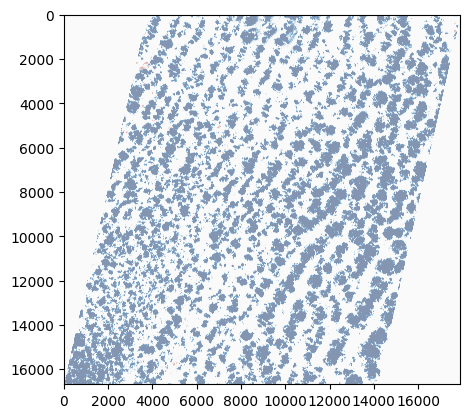

In [10]:
import numpy as np
import rasterio
from scipy import stats
from skimage.morphology import remove_small_objects

with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND2.tif") as src:
    G = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND3.tif") as src:
    R = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf16sep2024040353009000054/BAND4.tif") as src:
    NIR = src.read(1).astype(float)
with rasterio.open('/kaggle/working/cloud_mask_16sep.tif') as src:
    cloud_mask = src.read(1).astype(bool)


luminosity = (G + R + NIR)/3

cloudless_mask = np.logical_not(cloud_mask)

threshold = 0.15 * np.max(luminosity)
shadow_candidates = (luminosity < threshold) & cloudless_mask

ndwi = (G - NIR) / (G + NIR + 1e-10)
ndvi = (NIR - R) / (R + NIR + 1e-10) 
savi = ((NIR - R)/(NIR + R + 0.5)) * 1.5

cond1 = ndwi > 0.1
cond2 = (ndvi < 0.01) & (R < 0.11)
cond3 = (ndvi < 0.1) & (R < 0.05)
thres_savi = savi > 0.2

water_mask = np.float32(cond1 | cond2 | cond3)

final_shadow_mask = shadow_candidates & ~water_mask.astype(bool) #& ~thres_savi.astype(bool)

final_cleaned_shadow_mask = remove_small_objects(final_shadow_mask.astype(bool), min_size=50)

from scipy.ndimage import binary_closing, binary_opening
shadow_mask = binary_closing(binary_opening(final_cleaned_shadow_mask))

plt.imshow(shadow_mask, cmap='Reds', alpha = 0.5)
plt.imshow(cloud_mask, cmap = 'Blues', alpha = 0.5)
plt.show()

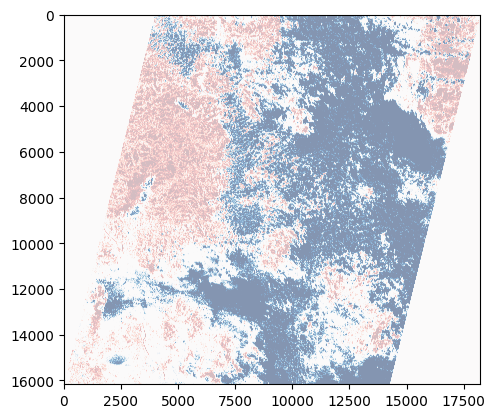

In [2]:
import numpy as np
import rasterio
from skimage.filters import sobel
from scipy import stats
import matplotlib.pyplot as plt
from skimage.morphology import remove_small_objects

with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND2.tif") as src:
    G = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND3.tif") as src:
    R = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND4.tif") as src:
    NIR = src.read(1).astype(float)
with rasterio.open('/kaggle/working/cloud_mask.tif') as src:
    cloud_mask = src.read(1).astype(bool)


luminosity = (G + R + NIR)/3

cloudless_mask = np.logical_not(cloud_mask)

threshold = 0.15 * np.max(luminosity)
shadow_candidates = (luminosity < threshold) & cloudless_mask

# luminosity_values = luminosity[cloudless_mask]
# if len(luminosity_values) > 0:
#     threshold = np.percentile(luminosity_values, 10)  # Use 10th percentile
# else:
#     threshold = 0.15 * np.max(luminosity)
# shadow_candidates = (luminosity < threshold) & cloudless_mask

texture = sobel(luminosity)
texture_threshold = np.percentile(texture[cloudless_mask], 90)
smooth_areas = texture < texture_threshold
shadow_candidates = shadow_candidates & smooth_areas

ndwi = (G - NIR) / (G + NIR + 1e-10)
ndvi = (NIR - R) / (R + NIR + 1e-10) 
savi = ((NIR - R)/(NIR + R + 0.5)) * 1.5

cond1 = ndwi > 0.1
cond2 = (ndvi < 0.01) & (R < 0.11)
cond3 = (ndvi < 0.1) & (R < 0.05)
thres_savi = savi > 0.2

water_mask = np.float32(cond1 | cond2 | cond3)

final_shadow_mask = shadow_candidates & ~water_mask.astype(bool) #& ~thres_savi.astype(bool)

final_cleaned_shadow_mask = remove_small_objects(final_shadow_mask.astype(bool), min_size=50)

from scipy.ndimage import binary_closing, binary_opening
shadow_mask = binary_closing(binary_opening(final_cleaned_shadow_mask))

plt.imshow(shadow_mask, cmap='Reds', alpha = 0.5)
plt.imshow(cloud_mask, cmap = 'Blues', alpha = 0.5)
plt.show()

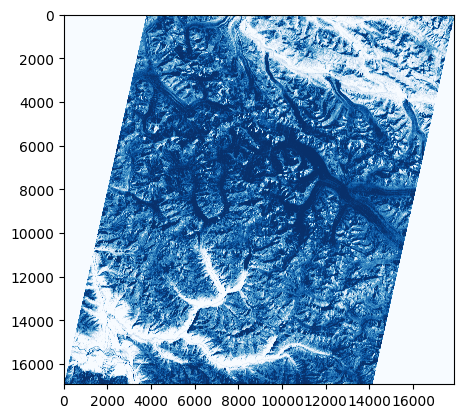

In [3]:
import numpy as np
import rasterio
from scipy import stats
import matplotlib.pyplot as plt
from skimage.morphology import remove_small_objects

with rasterio.open("/kaggle/input/raf23mar2025043024009400045/BAND2.tif") as src:
    G = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf23mar2025043024009400045/BAND3.tif") as src:
    R = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf23mar2025043024009400045/BAND4.tif") as src:
    NIR = src.read(1).astype(float)
# with rasterio.open('/kaggle/working/cloud_mask_1.tif') as src:
    # cloud_mask = src.read(1).astype(bool)

ndsi = (G - NIR) / (G + NIR + 1e-10)

thres_ndsi = ndsi > 0.01

plt.imshow(thres_ndsi, cmap='Blues')
plt.show()

In [12]:
np.mean(ndsi)

0.016589471720106094

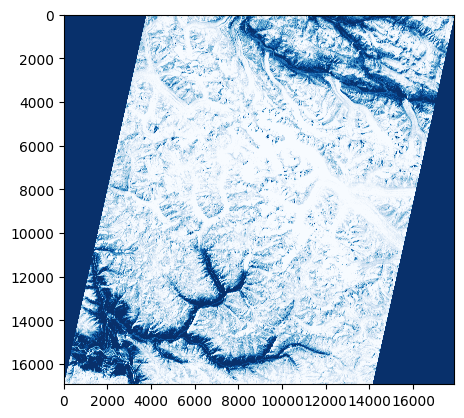

In [13]:
thres_ndsi = ndsi > 0.001

plt.imshow(thres_ndsi, cmap='Blues_r')
plt.show()

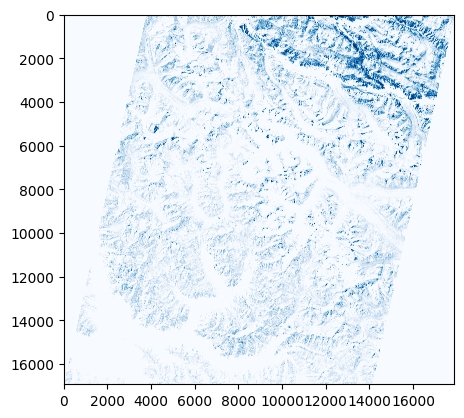

In [18]:
import numpy as np
import rasterio
from scipy import stats
import matplotlib.pyplot as plt
from skimage.morphology import remove_small_objects

with rasterio.open("/kaggle/input/raf23mar2025043024009400045/BAND2.tif") as src:
    G = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf23mar2025043024009400045/BAND3.tif") as src:
    R = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf23mar2025043024009400045/BAND4.tif") as src:
    NIR = src.read(1).astype(float)
with rasterio.open('/kaggle/working/cloud_mask_1.tif') as src:
    cloud_mask = src.read(1).astype(bool)

ndsi = (G - NIR) / (G + NIR + 1e-10)

thres_ndsi = (ndsi > 0.001).astype(bool)

corrected_cloud_mask = np.float16(np.logical_and(cloud_mask,~thres_ndsi))

plt.imshow(corrected_cloud_mask, cmap='Blues')
plt.show()

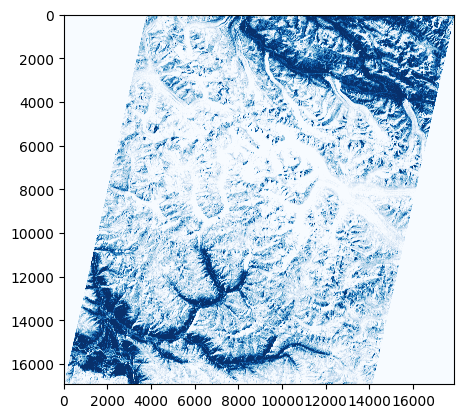

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rasterio

with rasterio.open("/kaggle/input/raf23mar2025043024009400045/BAND2.tif") as src:
    G = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf23mar2025043024009400045/BAND3.tif") as src:
    R = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf23mar2025043024009400045/BAND4.tif") as src:
    NIR = src.read(1).astype(float)
    
  
img = np.dstack((G, R, NIR)) 
ci_1 = (3 * img[:, :, 2]) / (img[:, :, 1] + img[:, :, 0] + 1e-10)  # NIR / (R + G + 1)
ci_2 = (img[:, :, 0] + img[:, :, 1] + img[:, :, 2]) / 3  # Avg of G, R, NIR
ndsi = (G - NIR) / (G + NIR + 1e-10)
thres_ndsi = ndsi < 0.01

T2 = np.mean(ci_2) + (0.01 * (np.max(ci_2) - np.mean(ci_2)))
prelim_cloud_mask = np.float32(np.logical_and(np.abs(ci_1 - 1) < 1, ci_2 > 0.01))
corrected_cloud_mask = np.float32(np.logical_and(prelim_cloud_mask, thres_ndsi))
final_cloud_mask = cv2.medianBlur(corrected_cloud_mask, 3)
final_cloud_mask = np.expand_dims(final_cloud_mask, axis=2).astype(np.uint16)


plt.imshow(final_cloud_mask, cmap='Blues')
plt.show()

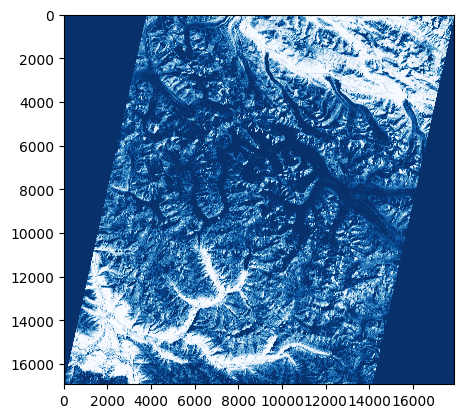

In [13]:
plt.imshow(final_cloud_mask, cmap='Blues_r')
plt.show()

In [7]:
import numpy as np
import cv2
import rasterio
from scipy.ndimage import shift
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops

def estimate_shadow_mask(cloud_mask, sun_azimuth, sun_zenith, cloud_height_km=1.0, pixel_resolution=30, erosion_kernel_size=3, dilation_kernel_size=3):
    """
    Estimate shadow mask from a binary cloud mask using erosion, shifting, and dilation.

    Args:
        cloud_mask (numpy.ndarray): Binary cloud mask (1=cloud, 0=no cloud).
        sun_azimuth (float): Sun azimuth angle in degrees (0-360, clockwise from North).
        sun_zenith (float): Sun zenith angle in degrees (0-90, 0=overhead).
        cloud_height_km (float): Assumed cloud height in kilometers.
        pixel_resolution (float): Ground resolution in meters/pixel.
        erosion_kernel_size (int): Kernel size for erosion (default: 3).
        dilation_kernel_size (int): Kernel size for dilation (default: 3).

    Returns:
        shadow_mask (numpy.ndarray): Estimated binary shadow mask (1=shadow, 0=no shadow).
    """
    sun_azimuth_rad = np.deg2rad(sun_azimuth)
    sun_zenith_rad = np.deg2rad(sun_zenith)

    # Step 1: Erode cloud mask to remove thin edges
    kernel_erode = np.ones((erosion_kernel_size, erosion_kernel_size), np.uint8)
    eroded_mask = cv2.erode(cloud_mask.astype(np.uint8), kernel_erode, iterations=1)

    # Step 2: Calculate shadow displacement (in pixels)
    shadow_length_m = cloud_height_km * 1000 / np.tan(sun_zenith_rad)
    shadow_length_px = shadow_length_m / pixel_resolution

    # Shift components (azimuth: 0°=North, 90°=East)
    dx = shadow_length_px * np.sin(sun_azimuth_rad)  # East-West shift
    dy = -shadow_length_px * np.cos(sun_azimuth_rad)  # North-South shift (negative for image coords)

    # Shift the eroded mask
    shifted_mask = shift(eroded_mask, (dy, dx), order=0, mode='constant', cval=0)

    # Step 3: Dilate shifted mask to account for shadow softness
    kernel_dilate = np.ones((dilation_kernel_size, dilation_kernel_size), np.uint8)
    dilated_mask = cv2.dilate(shifted_mask.astype(np.uint8), kernel_dilate, iterations=1)

    # Step 4: Remove original cloud pixels
    shadow_mask = np.where((dilated_mask == 1) & (cloud_mask == 0), 1, 0)

    return shadow_mask

def estimate_cloud_height_from_shadows(cloud_mask, shadow_mask, sun_zenith, pixel_resolution=30, min_cloud_size=10):
    """
    Estimate cloud height from shadow length for each cloud object.

    Args:
        cloud_mask (numpy.ndarray): Binary cloud mask (1=cloud, 0=no cloud).
        shadow_mask (numpy.ndarray): Binary shadow mask (1=shadow, 0=no shadow).
        sun_zenith (float): Solar zenith angle in degrees.
        pixel_resolution (float): Ground resolution in meters/pixel.
        min_cloud_size (int): Minimum cloud area (pixels) to consider.

    Returns:
        heights (list): Estimated heights (in meters) for each cloud object.
        labeled_clouds (numpy.ndarray): Labeled cloud objects.
    """
    sun_zenith_rad = np.deg2rad(sun_zenith)
    labeled_clouds = label(cloud_mask)
    regions = regionprops(labeled_clouds)
    heights = []

    for region in regions:
        if region.area < min_cloud_size:
            continue

        # Get cloud centroid
        cloud_y, cloud_x = region.centroid

        # Find nearest shadow pixel (optimized for large images)
        shadow_pixels = np.argwhere(shadow_mask == 1)
        if len(shadow_pixels) == 0:
            continue

        # Calculate distance to all shadow pixels
        distances = np.sqrt((shadow_pixels[:, 0] - cloud_y)**2 + (shadow_pixels[:, 1] - cloud_x)**2)
        nearest_shadow_idx = np.argmin(distances)
        shadow_y, shadow_x = shadow_pixels[nearest_shadow_idx]

        # Shadow length in pixels and meters
        shadow_length_px = np.sqrt((shadow_x - cloud_x)**2 + (shadow_y - cloud_y)**2)
        shadow_length_m = shadow_length_px * pixel_resolution

        # Cloud height estimate
        if shadow_length_m > 0:
            height = shadow_length_m * np.tan(sun_zenith_rad)
            heights.append(height)

    return heights, labeled_clouds

def plot_results(cloud_mask, shadow_mask, labeled_clouds, heights, pixel_resolution=30):
    """
    Plot cloud mask, shadow mask, and cloud height annotations.
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Cloud Mask
    axes[0].imshow(cloud_mask, cmap='Blues')
    axes[0].set_title('Cloud Mask')
    
    # Shadow Mask
    axes[1].imshow(shadow_mask, cmap='Reds')
    axes[1].set_title('Estimated Shadow Mask')
    
    # Cloud Height Annotations
    axes[2].imshow(labeled_clouds, cmap='viridis')
    regions = regionprops(labeled_clouds)
    for i, region in enumerate(regions):
        if i < len(heights):
            y, x = region.centroid
            axes[2].text(x, y, f"{heights[i]:.0f}m", color='white', fontsize=8, ha='center')
    axes[2].set_title('Cloud Height Estimates (m)')
    
    plt.tight_layout()
    plt.show()

# Example Usage
if __name__ == "__main__":
    # Load cloud mask (replace with your data)
    with rasterio.open("/kaggle/working/cloud_mask.tif") as src:
        cloud_mask = src.read(1)
        transform = src.transform
        pixel_resolution = transform[0]  # meters/pixel

    # Solar geometry (example: Landsat metadata)
    sun_azimuth = 100.452774 # Degrees (from North)
    sun_zenith = 20.457069 # Degrees (90 = horizon, 0 = overhead)
    cloud_height_guess = 5.0  # Initial guess (km)

    # Step 1: Estimate shadow mask
    shadow_mask = estimate_shadow_mask(
        cloud_mask, sun_azimuth, sun_zenith, cloud_height_guess, pixel_resolution,
        erosion_kernel_size=3, dilation_kernel_size=5
    )

    # Step 2: Estimate cloud heights from shadows
    heights, labeled_clouds = estimate_cloud_height_from_shadows(
        cloud_mask, shadow_mask, sun_zenith, pixel_resolution, min_cloud_size=10
    )

    # Step 3: Visualize results
    print(f"Estimated cloud heights (m): {heights}")
    plot_results(cloud_mask, shadow_mask, labeled_clouds, heights, pixel_resolution)

    # Save shadow mask (optional)
    # with rasterio.open(
    #     "shadow_mask.tif",
    #     'w',
    #     driver='GTiff',
    #     height=shadow_mask.shape[0],
    #     width=shadow_mask.shape[1],
    #     count=1,
    #     dtype=np.uint8,
    #     crs=src.crs,
    #     transform=transform,
    # ) as dst:
    #     dst.write(shadow_mask.astype(np.uint8), 1)

KeyboardInterrupt: 

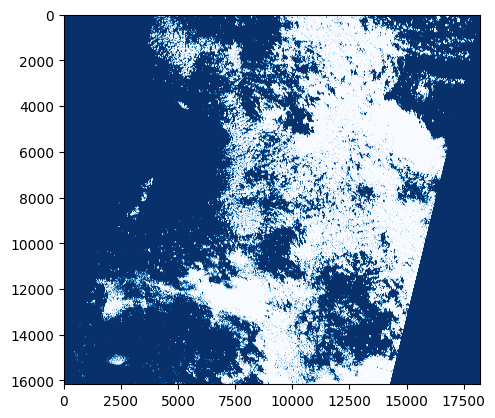

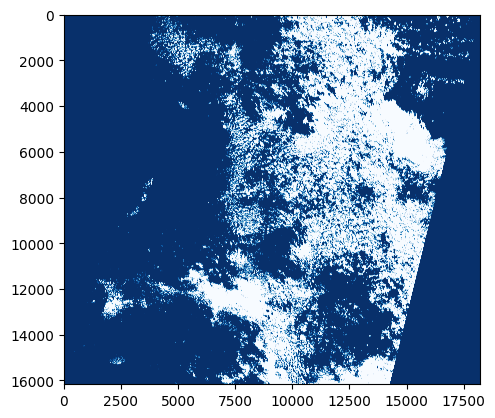

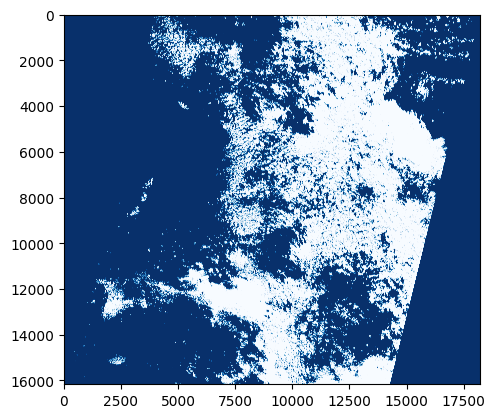

In [9]:
with rasterio.open("/kaggle/working/cloud_mask.tif") as src:
    cloud_mask = src.read(1)

erosion_kernel_size = 10
dilation_kernel_size = 10

kernel_erode = np.ones((erosion_kernel_size, erosion_kernel_size), np.uint8)
eroded_mask = cv2.erode(cloud_mask.astype(np.uint8), kernel_erode, iterations=1)

kernel_dilate = np.ones((dilation_kernel_size, dilation_kernel_size), np.uint8)
dilated_mask = cv2.dilate(eroded_mask.astype(np.uint8), kernel_dilate, iterations=1)

plt.imshow(cloud_mask, cmap='Blues_r')
plt.show()

plt.imshow(eroded_mask, cmap='Blues_r')
plt.show()

plt.imshow(dilated_mask, cmap='Blues_r')
plt.show()

In [3]:
import numpy as np
import rasterio
from scipy import stats
import matplotlib.pyplot as plt
import cv2

with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND2.tif") as src:
    G = src.read(1).astype(float)
    metadata = src.profile
with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND3.tif") as src:
    R = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND4.tif") as src:
    NIR = src.read(1).astype(float)
with rasterio.open('/kaggle/working/cloud_mask.tif') as src:
    cloud_mask = src.read(1).astype(bool)


luminosity = (G + R + NIR)/3

cloudless_mask = np.logical_not(cloud_mask)

threshold = 0.15 * np.max(luminosity)
shadow_candidates = (luminosity < threshold) & cloudless_mask

ndwi = (G - NIR) / (G + NIR + 1e-10)
ndvi = (NIR - R) / (R + NIR + 1e-10) 
savi = ((NIR - R)/(NIR + R + 0.5)) * 1.5

cond1 = ndwi > 0.1
cond2 = (ndvi < 0.01) & (R < 0.11)
cond3 = (ndvi < 0.1) & (R < 0.05)
thres_savi = savi > 0.2

water_mask = np.float32(cond1 | cond2 | cond3)

final_shadow_mask = shadow_candidates & ~water_mask.astype(bool) #& ~thres_savi.astype(bool)

erosion_kernel_size = 10
dilation_kernel_size = 10

# kernel_erode = np.ones((erosion_kernel_size, erosion_kernel_size), np.uint8)
kernel_erode = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (erosion_kernel_size, erosion_kernel_size))
eroded_mask = cv2.erode(final_shadow_mask.astype(np.uint8), kernel_erode, iterations=1)

# kernel_dilate = np.ones((dilation_kernel_size, dilation_kernel_size), np.uint8)
kernel_dilate = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (dilation_kernel_size, dilation_kernel_size))
dilated_mask = cv2.dilate(eroded_mask.astype(np.uint8), kernel_dilate, iterations=1)


from scipy.ndimage import binary_closing, binary_opening
shadow_mask = binary_closing(binary_opening(dilated_mask))

with rasterio.open('/kaggle/working/dilated_mask.tif', 'w', **metadata) as dst:
    dst.write(shadow_mask.astype(np.uint8), 1)

# plt.imshow(dilated_mask, cmap='Reds', alpha = 0.5)
# plt.imshow(cloud_mask, cmap = 'Blues', alpha = 0.5)
# plt.show()

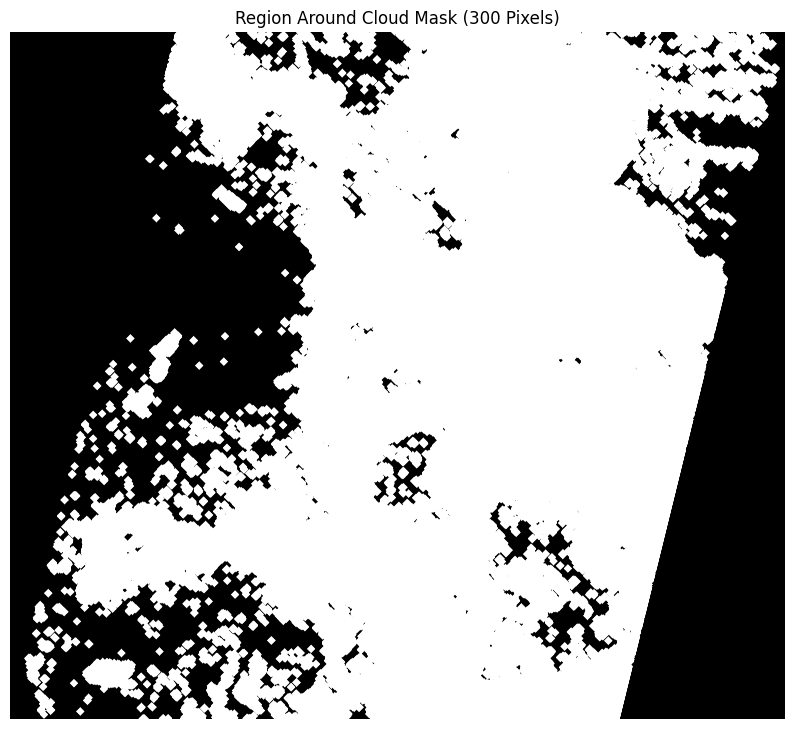

In [15]:
from scipy import ndimage

binary_mask = cloud_mask > 0
# Create a structuring element for dilation
dilated_mask = ndimage.binary_dilation(binary_mask, iterations=100)
# Plotting
plt.figure(figsize=(10, 10))
plt.imshow(dilated_mask, cmap='gray')
plt.title('Region Around Cloud Mask (300 Pixels)')
plt.axis('off')
plt.show()

x_dir  -0.3247696529637507
y_dir  0.04316944598283586
Region mask generated


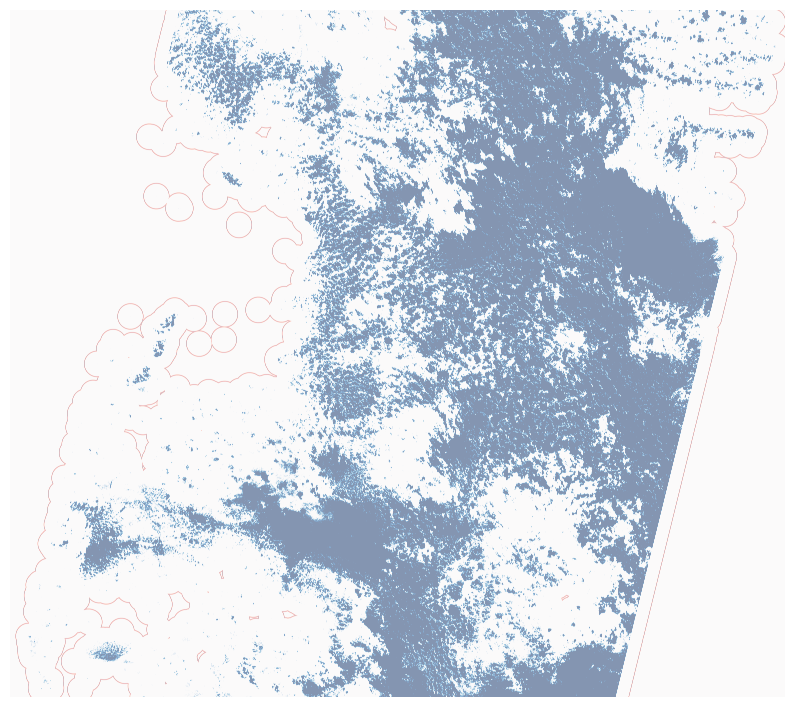

In [4]:
import rasterio
import numpy as np
from scipy.ndimage import binary_dilation, generate_binary_structure
from scipy.ndimage import distance_transform_edt
import matplotlib.pyplot as plt

def find_regions_300px_from_cloud(cloud_mask, x_dir, y_dir, target_distance=300, tolerance=10):
    """
    Find regions approximately 300 pixels away from the cloud mask along x_dir and y_dir.
    
    Args:
        cloud_mask: 2D binary array (1 = cloud, 0 = clear).
        x_dir: Direction vector (x-component) derived from solar/viewing geometry.
        y_dir: Direction vector (y-component) derived from solar/viewing geometry.
        target_distance: Desired distance (default: 300 pixels).
        tolerance: Allowed deviation (default: ±10 pixels).
    
    Returns:
        Binary mask where 1 indicates regions ~300 pixels away from clouds.
    """
    # Get cloud pixel coordinates
    cloud_coords = np.argwhere(cloud_mask)
    
    if len(cloud_coords) == 0:
        return np.zeros_like(cloud_mask)  # No clouds, return empty mask
    
    # Compute Euclidean distance to nearest cloud (alternatively, use Manhattan distance)
    distance_map = distance_transform_edt(~cloud_mask)
    
    # Define directional constraints (simplified: check if pixel aligns with x_dir/y_dir)
    # Here, we approximate the directional filtering.
    # A more precise method would involve checking displacement vectors.
    
    # Get mask where distance ≈ 300 ± tolerance
    region_mask = (distance_map >= target_distance - tolerance) & \
                  (distance_map <= target_distance + tolerance)


    # if np.sum(cloud_mask) == 0:
    #     return np.zeros_like(cloud_mask)
    
    # # Normalize direction vector
    # norm = np.sqrt(x_dir**2 + y_dir**2)
    # x_dir_norm, y_dir_norm = x_dir / norm, y_dir / norm
    
    # # Create a kernel to project shadows
    # kernel_length = target_distance + tolerance
    # xx, yy = np.meshgrid(np.arange(-kernel_length, kernel_length + 1), 
    #                      np.arange(-kernel_length, kernel_length + 1))
    
    # # Compute dot product to align with (x_dir, y_dir)
    # dot_product = xx * x_dir_norm + yy * y_dir_norm
    # radial_distance = np.sqrt(xx**2 + yy**2)
    
    # # Kernel: Pixels ~300px away along the direction
    # kernel = (np.abs(radial_distance - target_distance) <= tolerance) & \
    #          (dot_product >= 0)  # Ensure forward direction
    
    # # Dilate cloud_mask with the directional kernel
    # region_mask = binary_dilation(cloud_mask, structure=kernel)
    
    # # Subtract original clouds to isolate shadow regions
    # region_mask = region_mask & ~cloud_mask


    # Get cloud pixel coordinates
    # cloud_coords = np.argwhere(cloud_mask)
    
    # if len(cloud_coords) == 0:
    #     return np.zeros_like(cloud_mask)  # No clouds, return empty mask
    
    # # Compute Euclidean distance to nearest cloud (alternatively, use Manhattan distance)
    # distance_map = distance_transform_edt(~cloud_mask)
    
    # # Create a directional mask based on x_dir and y_dir
    # height, width = cloud_mask.shape
    # y_indices, x_indices = np.indices((height, width))
    
    # # Calculate the directional displacement
    # directional_mask = (x_indices * x_dir + y_indices * y_dir) > 0
    
    # # Get mask where distance ≈ 300 ± tolerance and aligns with direction
    # region_mask = (distance_map >= target_distance - tolerance) & \
    #               (distance_map <= target_distance + tolerance) & \
    #               directional_mask
    
    print("Region mask generated")
    
    return region_mask

with rasterio.open('/kaggle/working/cloud_mask.tif') as src:
    cloud_mask = src.read(1).astype(bool)

sat_zen_angle = np.deg2rad(2.787445)
sat_azi_angle = np.deg2rad(120.222328)
solar_zen_angle = np.deg2rad(20.457069)
solar_azi_angle = np.deg2rad(100.452774)

x_dir = np.tan(sat_zen_angle) * np.sin(sat_azi_angle) - np.tan(solar_zen_angle) * np.sin(solar_azi_angle)
y_dir = np.tan(sat_zen_angle) * np.cos(sat_azi_angle) - np.tan(solar_zen_angle) * np.cos(solar_azi_angle)

print("x_dir ", x_dir)
print("y_dir ", y_dir)

region_mask = find_regions_300px_from_cloud(cloud_mask, x_dir, y_dir, target_distance=300)

plt.figure(figsize=(10, 10))
plt.imshow(region_mask, cmap='Reds', alpha = 0.5)
plt.imshow(cloud_mask, cmap='Blues', alpha = 0.5)
plt.axis('off')
plt.show()

In [ ]:
import numpy as np
import rasterio
from scipy import stats
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import binary_dilation, generate_binary_structure
from scipy.ndimage import distance_transform_edt

with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND2.tif") as src:
    G = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND3.tif") as src:
    R = src.read(1).astype(float)
with rasterio.open("/kaggle/input/raf18may2025043819011000054ssanstuc00gtdc/BAND4.tif") as src:
    NIR = src.read(1).astype(float)
with rasterio.open('/kaggle/working/cloud_mask.tif') as src:
    cloud_mask = src.read(1).astype(bool)

def find_regions_300px_from_cloud(cloud_mask, target_distance=300, tolerance=10):

    # Get cloud pixel coordinates
    cloud_coords = np.argwhere(cloud_mask)
    
    if len(cloud_coords) == 0:
        return np.zeros_like(cloud_mask)  # No clouds, return empty mask
    
    # Compute Euclidean distance to nearest cloud (alternatively, use Manhattan distance)
    distance_map = distance_transform_edt(~cloud_mask)
    
    # Define directional constraints (simplified: check if pixel aligns with x_dir/y_dir)
    # Here, we approximate the directional filtering.
    # A more precise method would involve checking displacement vectors.
    
    # Get mask where distance ≈ 300 ± tolerance
    region_mask = (distance_map >= target_distance - tolerance) & \
                  (distance_map <= target_distance + tolerance)
    
    print("Region mask generated")
    
    return region_mask

luminosity = (G + R + NIR)/3

cloudless_mask = np.logical_not(cloud_mask)

threshold = 0.15 * np.max(luminosity)
shadow_candidates = (luminosity < threshold) & cloudless_mask

ndwi = (G - NIR) / (G + NIR + 1e-10)
ndvi = (NIR - R) / (R + NIR + 1e-10) 
savi = ((NIR - R)/(NIR + R + 0.5)) * 1.5

cond1 = ndwi > 0.1
cond2 = (ndvi < 0.01) & (R < 0.11)
cond3 = (ndvi < 0.1) & (R < 0.05)
thres_savi = savi > 0.2

water_mask = np.float32(cond1 | cond2 | cond3)

final_shadow_mask = shadow_candidates & ~water_mask.astype(bool) #& ~thres_savi.astype(bool)

erosion_kernel_size = 10
dilation_kernel_size = 10

# kernel_erode = np.ones((erosion_kernel_size, erosion_kernel_size), np.uint8)
kernel_erode = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (erosion_kernel_size, erosion_kernel_size))
eroded_mask = cv2.erode(final_shadow_mask.astype(np.uint8), kernel_erode, iterations=1)

# kernel_dilate = np.ones((dilation_kernel_size, dilation_kernel_size), np.uint8)
kernel_dilate = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (dilation_kernel_size, dilation_kernel_size))
dilated_mask = cv2.dilate(eroded_mask.astype(np.uint8), kernel_dilate, iterations=1)

region_mask = find_regions_300px_from_cloud(cloud_mask, target_distance=300)

dilated_mask_2 = dilated_mask & region_mask.astype(bool)

from scipy.ndimage import binary_closing, binary_opening
shadow_mask = binary_closing(binary_opening(dilated_mask_2))

plt.imshow(shadow_mask, cmap='Reds', alpha = 0.5)
plt.imshow(cloud_mask, cmap = 'Blues', alpha = 0.5)
plt.show()

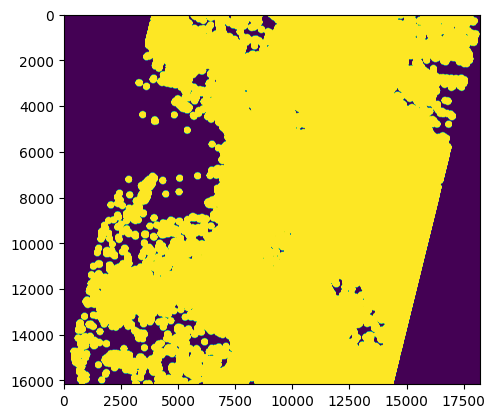

Region mask generated


In [11]:
import numpy as np
import rasterio
from scipy import stats
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import binary_dilation, generate_binary_structure
from scipy.ndimage import distance_transform_edt

with rasterio.open('/kaggle/working/cloud_mask.tif') as src:
    cloud_mask = src.read(1).astype(bool)
    metadata = src.profile
with rasterio.open('/kaggle/working/dilated_mask.tif') as src:
    dilated_mask = src.read(1).astype(bool)

def find_regions_300px_from_cloud(cloud_mask, target_distance=200, tolerance=10):

    cloud_coords = np.argwhere(cloud_mask)
    if len(cloud_coords) == 0:
        return np.zeros_like(cloud_mask) 
        
    distance_map = distance_transform_edt(~cloud_mask)
    
    # region_mask = (distance_map >= target_distance - tolerance) & \
    #               (distance_map <= target_distance + tolerance)
    region_mask = (distance_map <= target_distance + tolerance)

    region_mask = region_mask.astype(bool)
    plt.imshow(region_mask)
    plt.show()
    with rasterio.open('/kaggle/working/region_mask.tif', 'w', **metadata) as dst:
        dst.write(region_mask.astype(np.uint8), 1)
    
    print("Region mask generated")
    
    return region_mask


region_mask = find_regions_300px_from_cloud(cloud_mask, target_distance=150)

# dilated_mask_2 = dilated_mask & region_mask.astype(bool)

# from scipy.ndimage import binary_closing, binary_opening
# shadow_mask = binary_closing(binary_opening(dilated_mask_2))

# plt.imshow(shadow_mask, cmap='Reds', alpha = 0.5)
# plt.imshow(cloud_mask, cmap = 'Blues', alpha = 0.5)
# plt.show()

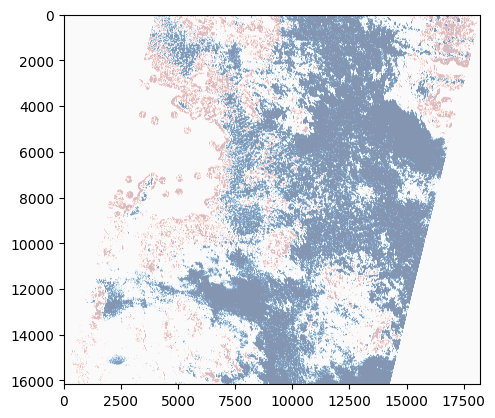

In [13]:
import numpy as np
import rasterio
from scipy import stats
import matplotlib.pyplot as plt
import cv2
from skimage.morphology import remove_small_objects
from scipy.ndimage import binary_dilation, generate_binary_structure
from scipy.ndimage import distance_transform_edt

with rasterio.open('/kaggle/working/cloud_mask.tif') as src:
    cloud_mask = src.read(1).astype(bool)
    metadata = src.profile
with rasterio.open('/kaggle/working/dilated_mask.tif') as src:
    dilated_mask = src.read(1).astype(bool)
with rasterio.open('/kaggle/working/region_mask.tif') as src:
    region_mask = src.read(1).astype(bool)

# binary_mask = cloud_mask > 0
# region_mask = ndimage.binary_dilation(binary_mask, iterations=100)

dilated_mask_2 = dilated_mask & region_mask.astype(bool)

final_cleaned_shadow_mask = remove_small_objects(dilated_mask_2.astype(bool), min_size=100)

from scipy.ndimage import binary_closing, binary_opening
shadow_mask = binary_closing(binary_opening(final_cleaned_shadow_mask))

plt.imshow(shadow_mask, cmap='Reds', alpha = 0.5)
plt.imshow(cloud_mask, cmap = 'Blues', alpha = 0.5)
plt.show()

In [16]:
with rasterio.open('/kaggle/working/final_shadow_mask.tif', 'w', **metadata) as dst:
    dst.write(shadow_mask.astype(np.uint8), 1)